In [ ]:
# kitti dataset
!gdown --id '14P9-IjC63F-CNqbypmD1d2m4tJV7xVQw' --output KITTI_small_data.zip

Downloading...
From: https://drive.google.com/uc?id=14P9-IjC63F-CNqbypmD1d2m4tJV7xVQw
To: /content/KITTI_small_data.zip
4.98GB [00:46, 108MB/s] 


In [ ]:
import zipfile
from zipfile import ZipFile
with zipfile.ZipFile("KITTI_small_data.zip","r") as zip_ref:
    zip_ref.extractall("targetdir")

Data

In [ ]:
import numpy as np
import torch
import random

from torch.utils.data import Dataset, DataLoader
from PIL import Image


class KITTI_TrainAugmentDataset(Dataset):
    def __init__(self, files, inpainted_directory, transform=None):
        self.files = files
        self.inpainted_directory = inpainted_directory

    def __getitem__(self, idx):
        # sample is a list containing names of a RGB image and corresponding depth image
        directory, image_ID = self.files[idx]
        # PIL.Image.open() Opens and identifies the given image file.
        image = Image.open(os.path.join(self.inpainted_directory,directory,"rgb_image03_"+image_ID)) 
        depth = Image.open(os.path.join(self.inpainted_directory,directory,"d_image03_"+image_ID)) 
        # Augmentation: random horizontal flip
        if random.random() < 0.5:
            image = image.transpose(Image.FLIP_LEFT_RIGHT)
            depth = depth.transpose(Image.FLIP_LEFT_RIGHT)
        # resize the depth ground truth from (1280,384) to (640,192) that is consist with the size of the predicted output.
        image = image.resize((640,192))
        depth = depth.resize((320,96))
        
        image = torch.clamp(torch.from_numpy(np.array(image).reshape(192,640,3)).float()/255,0,1).permute(2, 0, 1)
        depth = torch.clamp(torch.from_numpy(np.array(depth).reshape(96,320,1)).float()/256-5,0,80).permute(2, 0, 1)
        sample = {'image': image, 'depth': depth}
        return sample

    def __len__(self):
        return len(self.files)


class KITTI_TestDataset(Dataset):
    def __init__(self, files, val_inpainted_directory, transform=None):
        self.files = files
        self.inpainted_directory = val_inpainted_directory

    def __getitem__(self, idx):
        # sample is a list containing names of a RGB image and corresponding depth image
        directory, image_ID = self.files[idx]
        # PIL.Image.open() Opens and identifies the given image file.
        image = Image.open(os.path.join(self.inpainted_directory,directory,"rgb_image03_"+image_ID)) 
        depth = Image.open(os.path.join(self.inpainted_directory,directory,"d_image03_"+image_ID))  
        # resize the depth ground truth from (1280,384) to (640,192) that is consist with the size of the predicted output.
        image = image.resize((640,192))
        depth = depth.resize((320,96))
        
        image = torch.clamp(torch.from_numpy(np.array(image).reshape(192,640,3)).float()/255,0,1).permute(2, 0, 1)
        depth = torch.clamp(torch.from_numpy(np.array(depth).reshape(96,320,1)).float()/256-5,0,80).permute(2, 0, 1)
        sample = {'image': image, 'depth': depth}
        return sample

    def __len__(self):
        return len(self.files)

loss

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from math import exp

def L1loss(y_pred, y_true):
    l1_criterion = nn.L1Loss()
    l_depth = l1_criterion(y_pred, y_true)
    return l_depth

def lossgradient(y_pred, y_true):
    # y_true gradient step=1
    y_pred_left = y_pred
    y_pred_right = F.pad(y_pred, [0, 1, 0, 0])[:, :, :, 1:]
    y_pred_top = y_pred
    y_pred_bottom = F.pad(y_pred, [0, 0, 0, 1])[:, :, 1:, :]
    # dx, dy = torch.abs(right - left), torch.abs(bottom - top)
    dx_pred, dy_pred = y_pred_right - y_pred_left, y_pred_bottom - y_pred_top 
    dx_pred[:, :, :, -1] = 0
    dy_pred[:, :, -1, :] = 0

    # y_true gradient step=1
    y_true_left = y_true
    y_true_right = F.pad(y_true, [0, 1, 0, 0])[:, :, :, 1:]
    y_true_top = y_true
    y_true_bottom = F.pad(y_true, [0, 0, 0, 1])[:, :, 1:, :]
    # dx, dy = torch.abs(right - left), torch.abs(bottom - top)
    dx_true, dy_true = y_true_right - y_true_left, y_true_bottom - y_true_top 
    # dx will always have zeros in the last column, right-left
    # dy will always have zeros in the last row,    bottom-top
    dx_true[:, :, :, -1] = 0
    dy_true[:, :, -1, :] = 0
    
    l_edges = torch.mean(torch.abs(dy_pred - dy_true) + torch.abs(dx_pred - dx_true))
    return l_edges

def gaussian(window_size, sigma):
    gauss = torch.Tensor([exp(-(x - window_size//2)**2/float(2*sigma**2)) for x in range(window_size)])
    return gauss/gauss.sum()

def create_window(window_size, channel=1):
    _1D_window = gaussian(window_size, 1.5).unsqueeze(1)
    _2D_window = _1D_window.mm(_1D_window.t()).float().unsqueeze(0).unsqueeze(0)
    window = _2D_window.expand(channel, 1, window_size, window_size).contiguous()
    return window

def ssim(img1, img2, maxDepthVal, window_size=11, window=None, size_average=True, full=False):
    L = maxDepthVal

    padd = 0
    (_, channel, height, width) = img1.size()
    if window is None:
        real_size = min(window_size, height, width)
        window = create_window(real_size, channel=channel).to(img1.device)

    mu1 = F.conv2d(img1, window, padding=padd, groups=channel)
    mu2 = F.conv2d(img2, window, padding=padd, groups=channel)

    mu1_sq = mu1.pow(2)
    mu2_sq = mu2.pow(2)
    mu1_mu2 = mu1 * mu2

    sigma1_sq = F.conv2d(img1 * img1, window, padding=padd, groups=channel) - mu1_sq
    sigma2_sq = F.conv2d(img2 * img2, window, padding=padd, groups=channel) - mu2_sq
    sigma12 = F.conv2d(img1 * img2, window, padding=padd, groups=channel) - mu1_mu2

    C1 = (0.01 * L) ** 2
    C2 = (0.03 * L) ** 2

    v1 = 2.0 * sigma12 + C2
    v2 = sigma1_sq + sigma2_sq + C2
    cs = torch.mean(v1 / v2)  # contrast sensitivity

    ssim_map = ((2 * mu1_mu2 + C1) * v1) / ((mu1_sq + mu2_sq + C1) * v2)

    if size_average:
        ret = ssim_map.mean()
    else:
        ret = ssim_map.mean(1).mean(1).mean(1)

    if full:
        return ret, cs

    return ret

def depth_loss(y_pred, y_true):
    l_depth = L1loss(y_pred, y_true)
    l_edges = lossgradient(y_pred, y_true)
    l_ssim = torch.clamp((1 - ssim(y_pred, y_true, maxDepthVal=1000.0/10.0)) * 0.5, 0, 1)
    
    w1 = 1.0
    w2 = 1.0
    w3 = 1.0
    loss = ((w1 * l_depth) + (w2 * l_edges) + (w3 * l_ssim))
    return loss

loss_modify

In [ ]:
# import torch
# import torch.nn.functional as func
# from math import exp

# #Ldepth(y, ŷ)
# def l1_criterion(y_pred,y_true):
#   #compute point-wise L1 loss
#   l_depth = torch.mean(torch.abs(y_pred - y_true))
#   return l_depth

# #Lgrad(y, ŷ)
# def image_gradients(image):
#   #compute image gradient loss
#   left = image
#   right = func.pad(image,[0, 1, 0, 0])[:, :, :, 1:]
#   top = image
#   bottom = func.pad(image, [0, 0, 0, 1])[:, :, 1:, :]

#   dx = right - left
#   dy = bottom - top
#   dx[:, :, :, -1] = 0
#   dy[:, :, -1, :] = 0

#   return dx,dy

# #LSSIM (y, ŷ)
# #Structural similarity index is a method for predicting similarity of two images
# #An image quality metric that assesses the visual impact of three characteristics of an image: luminance, contrast and structure.
# def gaussian(window_size, sigma):
#   # Calculate the one-dimensional Gaussian distribution vector
#   def gauss(point):
#     return -(point - (window_size // 2))**2 / float(2 * sigma**2)
#   gauss = torch.Tensor([exp(gauss(point)) for point in range(window_size)])
#   return gauss / gauss.sum()

# def create_window(window_size, channel=1):
#   # Create a Gaussian kernel, obtained by matrix multiplication of two one-dimensional Gaussian distribution vectors
#   gaussian_kernel1d = gaussian(window_size, 1.5).unsqueeze(1)
#   gaussian_kernel2d = gaussian_kernel1d.mm(gaussian_kernel1d.t()).float().unsqueeze(0).unsqueeze(0)
#   window = gaussian_kernel2d.expand(channel, 1, window_size, window_size).contiguous()
#   return window

# def ssim(y_pred, y_true, data_range=None, window=None, size_average=True):
#   #If the data is not provided use max and min value from image to calculate data range
#   if data_range is None:
#     if torch.max(y_pred) > 128:
#       max_point = 255
#     else:
#       max_point = 1

#     if torch.min(y_pred) < -0.5:
#       min_point = -1
#     else:
#       min_point = 0
#     data_range = max_point - min_point


#     #get parameter from image
#     (_, channel, height, width) = y_pred.size()
#     #window_size is 11 by default
#     default_window_size=11

#     if window is None:
#         realWindowsize = min(default_window_size, height, width)
#         window = create_window(realWindowsize, channel=channel).to(y_pred.device)

#     #The formula Var(X)=E[X^2]-E[X]^2, cov(X,Y)=E[XY]-E[X]E[Y] is used when calculating variance and covariance .    
#     #mu_x the average of x
#     mu_x = func.conv2d(y_pred, window, padding=0, groups=channel)
#     #mu_y the average of y
#     mu_y = func.conv2d(y_true, window, padding=0, groups=channel)
#     #sigma_xy the covariance of x and y
#     Sigma_xy = func.conv2d(y_pred * y_true, window, padding=0, groups=channel) - (mu_x * mu_x) * (mu_y * mu_y)

#     #K1 = 0.01 and k2 = 0.03 by default
#     K1 = 0.01
#     K2 = 0.03
#     #C1 and C2 two variables to stabilize the division with weak denominator
#     ##L is the dynamic range of the pixel-values which either provided by user or calculate from before
#     C1 = (K1 * data_range) ** 2
#     C2 = (K2 * data_range) ** 2

#     Denominator = (2 * mu_x * mu_y + C1) * (2 * Sigma_xy + C2)
#     #sigma_x^2 is the variance of x
#     Sigma_x_sq = func.conv2d(y_pred * y_pred, window, padding=0, groups=channel) - mu_x * mu_x
#     #sigma_y^2 is the variance of y
#     Sigma_y_sq = func.conv2d(y_true * y_true, window, padding=0, groups=channel) - mu_y * mu_y

#     Numerator = (mu_x * mu_x + C1) *(Sigma_x_sq + Sigma_y_sq + C2)

#     ssim_map = Denominator / Numerator

#     if size_average:
#         return ssim_map.mean()
#     else:
#         return ssim_map.mean(1).mean(1).mean(1)

# def depth_loss(y_pred, y_true):
#   #Ldepth(y, ŷ)
#   l_depth = l1_criterion(y_pred, y_true)
#   #Lgrad(y, ŷ)
#   dx_true, dy_true = image_gradients(y_true)
#   dx_pred, dy_pred = image_gradients(y_pred)
#   l_edges = torch.mean(torch.abs(dy_pred - dy_true) + torch.abs(dx_pred - dx_true))
#   #LSSIM (y, ŷ)
#   l_ssim = torch.clamp((1 - ssim(y_pred, y_true)) * 0.5, 0, 1)

#   #loss 
#   w1 = 0.1
#   w2 = 1.0
#   w3 = 1.0
#   loss= (w1 * l_depth) + (w2 * l_edges) + (w3 * l_ssim)
#   return loss

model

In [ ]:
import torch
import torch.nn as nn
from torchvision import models
import torch.nn.functional as F

class UpSample(nn.Sequential):
    def __init__(self, skip_input, output_features):
        super(UpSample, self).__init__()        
        self.convA = nn.Conv2d(skip_input, output_features, kernel_size=3, stride=1, padding=1)
        self.leakyreluA = nn.LeakyReLU(0.2)
        self.convB = nn.Conv2d(output_features, output_features, kernel_size=3, stride=1, padding=1)
        self.leakyreluB = nn.LeakyReLU(0.2)

    def forward(self, x, concat_with):
        up_x = F.interpolate(x, size=[concat_with.size(2), concat_with.size(3)], mode='bilinear', align_corners=True)
        return self.leakyreluB( self.convB( self.leakyreluA(self.convA( torch.cat([up_x, concat_with], dim=1)  ) )))
        # return self.leakyreluB( self.convB( self.convA( torch.cat([up_x, concat_with], dim=1)  ) )  )

class Decoder(nn.Module):
    def __init__(self, num_features=1664, decoder_width = 1.0):
        super(Decoder, self).__init__()
        features = int(num_features * decoder_width)

        self.conv2 = nn.Conv2d(num_features, features, kernel_size=1, stride=1, padding=0)

        self.up1 = UpSample(skip_input=features//1 + 256, output_features=features//2)
        self.up2 = UpSample(skip_input=features//2 + 128,  output_features=features//4)
        self.up3 = UpSample(skip_input=features//4 + 64,  output_features=features//8)
        self.up4 = UpSample(skip_input=features//8 + 64,  output_features=features//16)

        self.conv3 = nn.Conv2d(features//16, 1, kernel_size=3, stride=1, padding=1)

    def forward(self, features):
        x_block0, x_block1, x_block2, x_block3, x_block4 = features[3], features[4], features[6], features[8], features[12]
        x_d0 = self.conv2(F.relu(x_block4))

        x_d1 = self.up1(x_d0, x_block3)
        x_d2 = self.up2(x_d1, x_block2)
        x_d3 = self.up3(x_d2, x_block1)
        x_d4 = self.up4(x_d3, x_block0)
        return self.conv3(x_d4)

class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        # pretrained (bool): If True, returns a model pre-trained on ImageNet
        self.original_model = models.densenet169( pretrained=True )

    def forward(self, x):
        features = [x]
        for k, v in self.original_model.features._modules.items(): features.append( v(features[-1]) )
        return features

class DepthModel(nn.Module):
    def __init__(self):
        super(DepthModel, self).__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()

    def forward(self, x):
        return self.decoder( self.encoder(x) )

train

Downloading: "https://download.pytorch.org/models/densenet169-b2777c0a.pth" to /root/.cache/torch/hub/checkpoints/densenet169-b2777c0a.pth


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Epoch [1/50][1/438], 8.10 sec(s), Batch loss:15.98942 (Avg:15.98942)


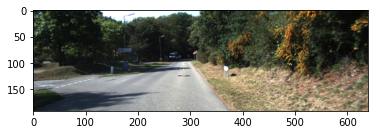

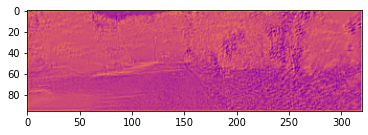

Epoch [1/50][11/438], 6.95 sec(s), Batch loss:9.48506 (Avg:13.38598)
Epoch [1/50][21/438], 6.75 sec(s), Batch loss:7.76149 (Avg:10.66315)
Epoch [1/50][31/438], 6.68 sec(s), Batch loss:5.51841 (Avg:9.19515)
Epoch [1/50][41/438], 6.64 sec(s), Batch loss:5.32047 (Avg:8.46679)
Epoch [1/50][51/438], 6.62 sec(s), Batch loss:5.53154 (Avg:7.93491)
Epoch [1/50][61/438], 6.63 sec(s), Batch loss:4.49063 (Avg:7.55579)
Epoch [1/50][71/438], 6.65 sec(s), Batch loss:8.54687 (Avg:7.43392)
Epoch [1/50][81/438], 6.66 sec(s), Batch loss:7.61619 (Avg:7.36069)
Epoch [1/50][91/438], 6.67 sec(s), Batch loss:6.56821 (Avg:7.32329)
Epoch [1/50][101/438], 6.67 sec(s), Batch loss:6.46552 (Avg:7.11529)
Epoch [1/50][111/438], 6.67 sec(s), Batch loss:5.96408 (Avg:6.98416)
Epoch [1/50][121/438], 6.68 sec(s), Batch loss:6.46017 (Avg:6.82254)
Epoch [1/50][131/438], 6.68 sec(s), Batch loss:6.02261 (Avg:6.69441)
Epoch [1/50][141/438], 6.69 sec(s), Batch loss:3.37509 (Avg:6.56940)
Epoch [1/50][151/438], 6.68 sec(s), Batch

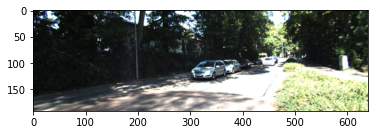

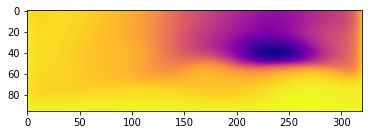

Epoch [1/50][411/438], 6.64 sec(s), Batch loss:3.90200 (Avg:5.13281)
Epoch [1/50][421/438], 6.64 sec(s), Batch loss:3.78397 (Avg:5.10262)
Epoch [1/50][431/438], 6.64 sec(s), Batch loss:3.72430 (Avg:5.06215)


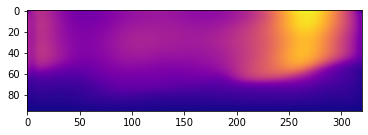

Epoch [1/50], 301.89 sec(s), Avg Train loss:5.05250, Avg Test loss:5.90115
Epoch [2/50][1/438], 6.70 sec(s), Batch loss:3.41296 (Avg:3.41296)


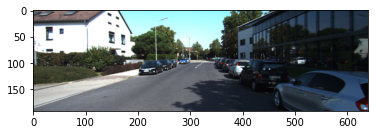

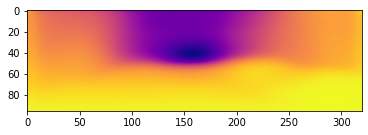

Epoch [2/50][11/438], 6.98 sec(s), Batch loss:4.71486 (Avg:3.72729)
Epoch [2/50][21/438], 6.81 sec(s), Batch loss:3.80054 (Avg:3.92433)
Epoch [2/50][31/438], 6.76 sec(s), Batch loss:4.30193 (Avg:3.95978)
Epoch [2/50][41/438], 6.73 sec(s), Batch loss:3.37620 (Avg:3.90230)
Epoch [2/50][51/438], 6.73 sec(s), Batch loss:3.50231 (Avg:3.89037)
Epoch [2/50][61/438], 6.74 sec(s), Batch loss:3.10871 (Avg:3.90336)
Epoch [2/50][71/438], 6.75 sec(s), Batch loss:2.90117 (Avg:3.84658)
Epoch [2/50][81/438], 6.77 sec(s), Batch loss:2.54997 (Avg:3.77850)
Epoch [2/50][91/438], 6.77 sec(s), Batch loss:3.48405 (Avg:3.78372)
Epoch [2/50][101/438], 6.76 sec(s), Batch loss:4.19179 (Avg:3.77642)
Epoch [2/50][111/438], 6.77 sec(s), Batch loss:3.91552 (Avg:3.75537)
Epoch [2/50][121/438], 6.77 sec(s), Batch loss:3.03792 (Avg:3.72584)
Epoch [2/50][131/438], 6.77 sec(s), Batch loss:3.01605 (Avg:3.67536)
Epoch [2/50][141/438], 6.77 sec(s), Batch loss:2.96514 (Avg:3.64833)
Epoch [2/50][151/438], 6.76 sec(s), Batch l

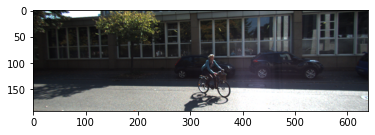

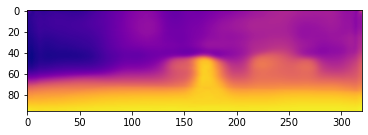

Epoch [2/50][411/438], 6.68 sec(s), Batch loss:2.67738 (Avg:3.42386)
Epoch [2/50][421/438], 6.69 sec(s), Batch loss:3.30504 (Avg:3.41215)
Epoch [2/50][431/438], 6.69 sec(s), Batch loss:2.82236 (Avg:3.39717)


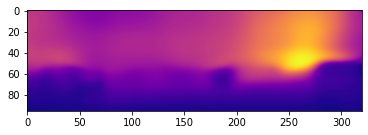

Epoch [2/50], 303.58 sec(s), Avg Train loss:3.38537, Avg Test loss:6.09138
Epoch [3/50][1/438], 6.61 sec(s), Batch loss:2.59071 (Avg:2.59071)


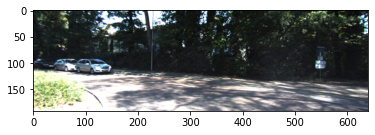

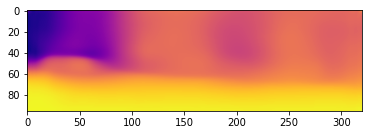

Epoch [3/50][11/438], 6.77 sec(s), Batch loss:3.02525 (Avg:3.02898)
Epoch [3/50][21/438], 6.65 sec(s), Batch loss:2.91896 (Avg:2.90119)
Epoch [3/50][31/438], 6.60 sec(s), Batch loss:2.95374 (Avg:2.91631)
Epoch [3/50][41/438], 6.60 sec(s), Batch loss:2.49829 (Avg:2.88796)
Epoch [3/50][51/438], 6.64 sec(s), Batch loss:2.85848 (Avg:2.94977)
Epoch [3/50][61/438], 6.66 sec(s), Batch loss:3.72110 (Avg:3.02204)
Epoch [3/50][71/438], 6.68 sec(s), Batch loss:2.74423 (Avg:3.03761)
Epoch [3/50][81/438], 6.68 sec(s), Batch loss:2.90572 (Avg:2.99848)
Epoch [3/50][91/438], 6.66 sec(s), Batch loss:3.32035 (Avg:2.99016)
Epoch [3/50][101/438], 6.64 sec(s), Batch loss:3.33606 (Avg:2.97884)
Epoch [3/50][111/438], 6.63 sec(s), Batch loss:3.08270 (Avg:2.97404)
Epoch [3/50][121/438], 6.62 sec(s), Batch loss:2.63372 (Avg:2.94898)
Epoch [3/50][131/438], 6.61 sec(s), Batch loss:5.85954 (Avg:3.00667)
Epoch [3/50][141/438], 6.61 sec(s), Batch loss:3.87590 (Avg:3.04623)
Epoch [3/50][151/438], 6.62 sec(s), Batch l

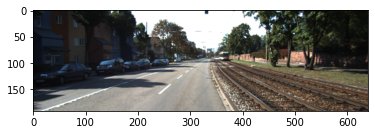

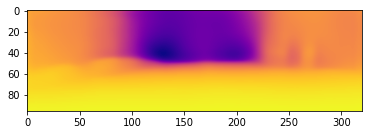

Epoch [3/50][411/438], 6.65 sec(s), Batch loss:2.38410 (Avg:2.96651)
Epoch [3/50][421/438], 6.65 sec(s), Batch loss:2.48007 (Avg:2.96757)
Epoch [3/50][431/438], 6.65 sec(s), Batch loss:3.20544 (Avg:2.96474)


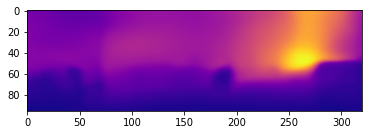

Epoch [3/50], 302.03 sec(s), Avg Train loss:2.95818, Avg Test loss:5.37778
Epoch [4/50][1/438], 6.68 sec(s), Batch loss:2.28635 (Avg:2.28635)


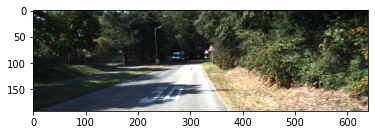

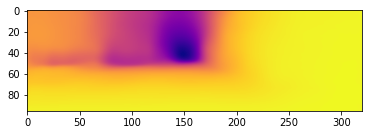

Epoch [4/50][11/438], 6.81 sec(s), Batch loss:2.75709 (Avg:2.57297)
Epoch [4/50][21/438], 6.68 sec(s), Batch loss:2.73423 (Avg:2.57939)
Epoch [4/50][31/438], 6.64 sec(s), Batch loss:2.31651 (Avg:2.54991)
Epoch [4/50][41/438], 6.68 sec(s), Batch loss:2.22326 (Avg:2.55981)
Epoch [4/50][51/438], 6.70 sec(s), Batch loss:2.90639 (Avg:2.56958)
Epoch [4/50][61/438], 6.72 sec(s), Batch loss:2.86292 (Avg:2.56433)
Epoch [4/50][71/438], 6.72 sec(s), Batch loss:3.10608 (Avg:2.56361)
Epoch [4/50][81/438], 6.70 sec(s), Batch loss:2.56341 (Avg:2.58950)
Epoch [4/50][91/438], 6.69 sec(s), Batch loss:2.62019 (Avg:2.60817)
Epoch [4/50][101/438], 6.67 sec(s), Batch loss:2.60789 (Avg:2.63201)
Epoch [4/50][111/438], 6.66 sec(s), Batch loss:2.18495 (Avg:2.63378)
Epoch [4/50][121/438], 6.65 sec(s), Batch loss:2.45243 (Avg:2.63206)
Epoch [4/50][131/438], 6.64 sec(s), Batch loss:2.19220 (Avg:2.61306)
Epoch [4/50][141/438], 6.65 sec(s), Batch loss:3.38634 (Avg:2.60896)
Epoch [4/50][151/438], 6.66 sec(s), Batch l

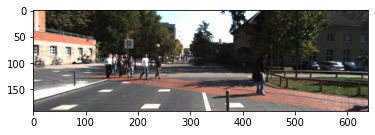

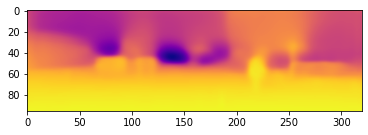

Epoch [4/50][411/438], 6.68 sec(s), Batch loss:2.42548 (Avg:2.57108)
Epoch [4/50][421/438], 6.68 sec(s), Batch loss:1.99843 (Avg:2.56651)
Epoch [4/50][431/438], 6.68 sec(s), Batch loss:2.35533 (Avg:2.56166)


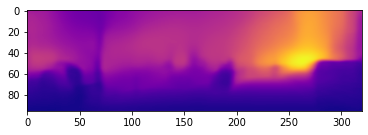

Epoch [4/50], 303.13 sec(s), Avg Train loss:2.55646, Avg Test loss:5.81760
Epoch [5/50][1/438], 6.69 sec(s), Batch loss:2.25315 (Avg:2.25315)


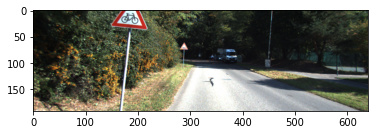

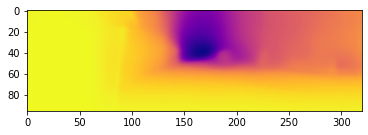

Epoch [5/50][11/438], 6.81 sec(s), Batch loss:1.90733 (Avg:2.49381)
Epoch [5/50][21/438], 6.68 sec(s), Batch loss:2.56627 (Avg:2.48432)
Epoch [5/50][31/438], 6.71 sec(s), Batch loss:2.63048 (Avg:2.53579)
Epoch [5/50][41/438], 6.74 sec(s), Batch loss:2.51714 (Avg:2.50438)
Epoch [5/50][51/438], 6.75 sec(s), Batch loss:2.23272 (Avg:2.44717)
Epoch [5/50][61/438], 6.76 sec(s), Batch loss:2.64854 (Avg:2.43649)
Epoch [5/50][71/438], 6.74 sec(s), Batch loss:2.55707 (Avg:2.44446)
Epoch [5/50][81/438], 6.72 sec(s), Batch loss:2.47458 (Avg:2.43993)
Epoch [5/50][91/438], 6.70 sec(s), Batch loss:2.18185 (Avg:2.45494)
Epoch [5/50][101/438], 6.69 sec(s), Batch loss:2.61680 (Avg:2.44240)
Epoch [5/50][111/438], 6.68 sec(s), Batch loss:1.86324 (Avg:2.45532)
Epoch [5/50][121/438], 6.67 sec(s), Batch loss:2.58614 (Avg:2.46254)
Epoch [5/50][131/438], 6.68 sec(s), Batch loss:2.15616 (Avg:2.47846)
Epoch [5/50][141/438], 6.69 sec(s), Batch loss:2.92339 (Avg:2.46943)
Epoch [5/50][151/438], 6.70 sec(s), Batch l

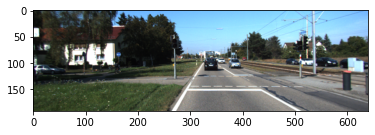

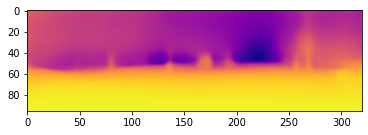

Epoch [5/50][411/438], 6.69 sec(s), Batch loss:2.31146 (Avg:2.52844)
Epoch [5/50][421/438], 6.68 sec(s), Batch loss:2.48480 (Avg:2.52145)
Epoch [5/50][431/438], 6.68 sec(s), Batch loss:2.30484 (Avg:2.52726)


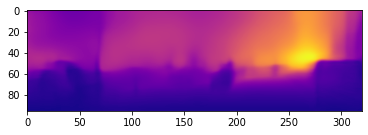

Epoch [5/50], 303.43 sec(s), Avg Train loss:2.52557, Avg Test loss:5.84176
Epoch [6/50][1/438], 6.67 sec(s), Batch loss:2.83590 (Avg:2.83590)


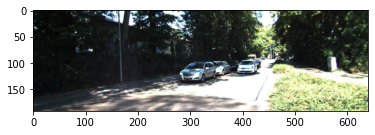

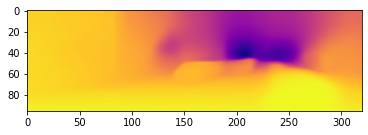

Epoch [6/50][11/438], 6.84 sec(s), Batch loss:2.39468 (Avg:2.64191)
Epoch [6/50][21/438], 6.82 sec(s), Batch loss:2.28761 (Avg:2.57069)
Epoch [6/50][31/438], 6.82 sec(s), Batch loss:2.39771 (Avg:2.48961)
Epoch [6/50][41/438], 6.82 sec(s), Batch loss:2.40861 (Avg:2.44089)
Epoch [6/50][51/438], 6.82 sec(s), Batch loss:2.18055 (Avg:2.41288)
Epoch [6/50][61/438], 6.77 sec(s), Batch loss:2.62387 (Avg:2.42390)
Epoch [6/50][71/438], 6.75 sec(s), Batch loss:1.93786 (Avg:2.42402)
Epoch [6/50][81/438], 6.72 sec(s), Batch loss:2.00334 (Avg:2.39839)
Epoch [6/50][91/438], 6.70 sec(s), Batch loss:2.07387 (Avg:2.37638)
Epoch [6/50][101/438], 6.69 sec(s), Batch loss:2.32178 (Avg:2.35699)
Epoch [6/50][111/438], 6.68 sec(s), Batch loss:1.89887 (Avg:2.34456)
Epoch [6/50][121/438], 6.69 sec(s), Batch loss:1.86718 (Avg:2.32184)
Epoch [6/50][131/438], 6.70 sec(s), Batch loss:2.37078 (Avg:2.32365)
Epoch [6/50][141/438], 6.71 sec(s), Batch loss:2.00052 (Avg:2.34302)
Epoch [6/50][151/438], 6.72 sec(s), Batch l

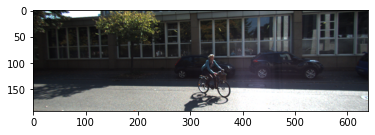

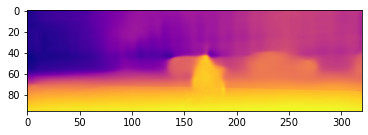

Epoch [6/50][411/438], 6.70 sec(s), Batch loss:2.29198 (Avg:2.32079)
Epoch [6/50][421/438], 6.70 sec(s), Batch loss:1.95893 (Avg:2.31802)
Epoch [6/50][431/438], 6.69 sec(s), Batch loss:2.08180 (Avg:2.31896)


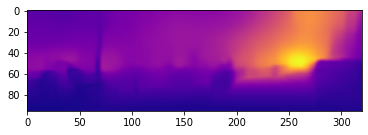

Epoch [6/50], 303.82 sec(s), Avg Train loss:2.31977, Avg Test loss:5.63297
Epoch [7/50][1/438], 6.73 sec(s), Batch loss:2.17622 (Avg:2.17622)


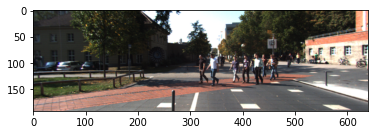

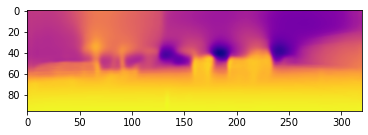

Epoch [7/50][11/438], 7.00 sec(s), Batch loss:2.06476 (Avg:2.12046)
Epoch [7/50][21/438], 6.92 sec(s), Batch loss:2.30035 (Avg:2.19951)
Epoch [7/50][31/438], 6.89 sec(s), Batch loss:2.22968 (Avg:2.24597)
Epoch [7/50][41/438], 6.86 sec(s), Batch loss:2.20699 (Avg:2.34125)
Epoch [7/50][51/438], 6.80 sec(s), Batch loss:2.55409 (Avg:2.31531)
Epoch [7/50][61/438], 6.77 sec(s), Batch loss:2.11313 (Avg:2.29832)
Epoch [7/50][71/438], 6.74 sec(s), Batch loss:2.08661 (Avg:2.25747)
Epoch [7/50][81/438], 6.72 sec(s), Batch loss:2.20409 (Avg:2.26451)
Epoch [7/50][91/438], 6.70 sec(s), Batch loss:1.90903 (Avg:2.26053)
Epoch [7/50][101/438], 6.69 sec(s), Batch loss:2.36554 (Avg:2.23923)
Epoch [7/50][111/438], 6.70 sec(s), Batch loss:1.94303 (Avg:2.23115)
Epoch [7/50][121/438], 6.71 sec(s), Batch loss:2.01438 (Avg:2.23593)
Epoch [7/50][131/438], 6.71 sec(s), Batch loss:1.87788 (Avg:2.23746)
Epoch [7/50][141/438], 6.72 sec(s), Batch loss:2.28954 (Avg:2.22790)
Epoch [7/50][151/438], 6.71 sec(s), Batch l

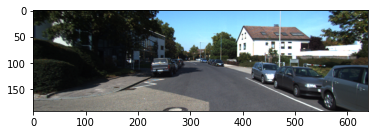

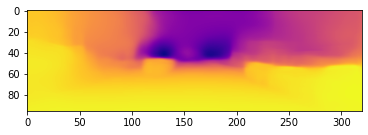

Epoch [7/50][411/438], 6.70 sec(s), Batch loss:2.38504 (Avg:2.25486)
Epoch [7/50][421/438], 6.70 sec(s), Batch loss:2.04727 (Avg:2.25135)
Epoch [7/50][431/438], 6.70 sec(s), Batch loss:1.81482 (Avg:2.24798)


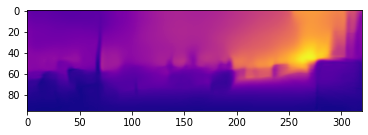

Epoch [7/50], 304.25 sec(s), Avg Train loss:2.24666, Avg Test loss:5.89901
Epoch [8/50][1/438], 6.89 sec(s), Batch loss:1.54069 (Avg:1.54069)


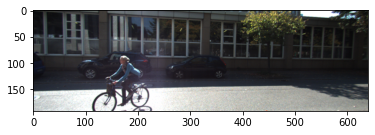

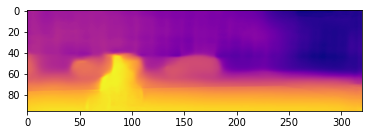

Epoch [8/50][11/438], 7.07 sec(s), Batch loss:2.20891 (Avg:2.00188)
Epoch [8/50][21/438], 6.96 sec(s), Batch loss:1.99952 (Avg:2.06144)
Epoch [8/50][31/438], 6.91 sec(s), Batch loss:2.13171 (Avg:2.05130)
Epoch [8/50][41/438], 6.82 sec(s), Batch loss:2.01912 (Avg:2.01881)
Epoch [8/50][51/438], 6.77 sec(s), Batch loss:2.01689 (Avg:2.06267)
Epoch [8/50][61/438], 6.74 sec(s), Batch loss:2.24264 (Avg:2.04614)
Epoch [8/50][71/438], 6.72 sec(s), Batch loss:1.53903 (Avg:2.03895)
Epoch [8/50][81/438], 6.71 sec(s), Batch loss:1.90365 (Avg:2.03163)
Epoch [8/50][91/438], 6.69 sec(s), Batch loss:1.84158 (Avg:2.02342)
Epoch [8/50][101/438], 6.70 sec(s), Batch loss:1.46792 (Avg:2.01548)
Epoch [8/50][111/438], 6.71 sec(s), Batch loss:2.01061 (Avg:2.05527)
Epoch [8/50][121/438], 6.72 sec(s), Batch loss:2.83279 (Avg:2.07707)
Epoch [8/50][131/438], 6.72 sec(s), Batch loss:2.06645 (Avg:2.08276)
Epoch [8/50][141/438], 6.71 sec(s), Batch loss:2.14765 (Avg:2.09969)
Epoch [8/50][151/438], 6.70 sec(s), Batch l

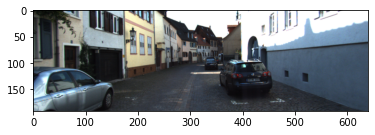

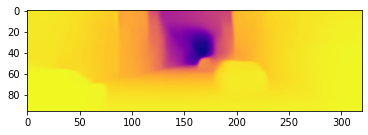

Epoch [8/50][411/438], 6.70 sec(s), Batch loss:1.98862 (Avg:2.14784)
Epoch [8/50][421/438], 6.69 sec(s), Batch loss:1.63267 (Avg:2.14427)
Epoch [8/50][431/438], 6.69 sec(s), Batch loss:1.81258 (Avg:2.14571)


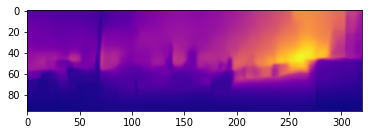

Epoch [8/50], 304.35 sec(s), Avg Train loss:2.14939, Avg Test loss:5.63704
Epoch [9/50][1/438], 6.93 sec(s), Batch loss:1.88872 (Avg:1.88872)


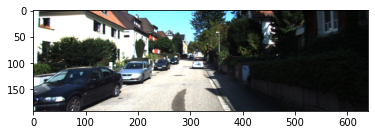

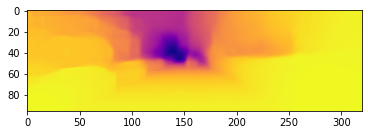

Epoch [9/50][11/438], 7.09 sec(s), Batch loss:2.98369 (Avg:2.59030)
Epoch [9/50][21/438], 6.95 sec(s), Batch loss:2.39824 (Avg:2.72042)
Epoch [9/50][31/438], 6.82 sec(s), Batch loss:2.83785 (Avg:2.62830)
Epoch [9/50][41/438], 6.76 sec(s), Batch loss:1.96923 (Avg:2.50692)
Epoch [9/50][51/438], 6.73 sec(s), Batch loss:1.95429 (Avg:2.39830)
Epoch [9/50][61/438], 6.71 sec(s), Batch loss:1.83137 (Avg:2.33129)
Epoch [9/50][71/438], 6.68 sec(s), Batch loss:2.40104 (Avg:2.29593)
Epoch [9/50][81/438], 6.67 sec(s), Batch loss:1.81798 (Avg:2.26929)
Epoch [9/50][91/438], 6.68 sec(s), Batch loss:1.63375 (Avg:2.24095)
Epoch [9/50][101/438], 6.70 sec(s), Batch loss:2.02388 (Avg:2.22065)
Epoch [9/50][111/438], 6.71 sec(s), Batch loss:1.66799 (Avg:2.19276)
Epoch [9/50][121/438], 6.72 sec(s), Batch loss:1.79300 (Avg:2.18772)
Epoch [9/50][131/438], 6.71 sec(s), Batch loss:2.01665 (Avg:2.17273)
Epoch [9/50][141/438], 6.70 sec(s), Batch loss:1.91657 (Avg:2.15253)
Epoch [9/50][151/438], 6.69 sec(s), Batch l

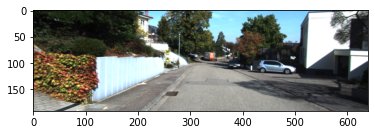

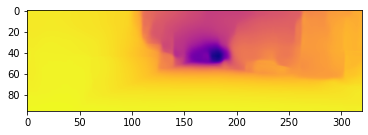

Epoch [9/50][411/438], 6.67 sec(s), Batch loss:2.22537 (Avg:2.10430)
Epoch [9/50][421/438], 6.67 sec(s), Batch loss:1.83667 (Avg:2.09935)
Epoch [9/50][431/438], 6.67 sec(s), Batch loss:1.99175 (Avg:2.09410)


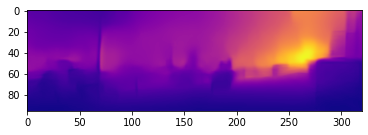

Epoch [9/50], 303.43 sec(s), Avg Train loss:2.08995, Avg Test loss:5.55041
Epoch [10/50][1/438], 6.89 sec(s), Batch loss:1.95792 (Avg:1.95792)


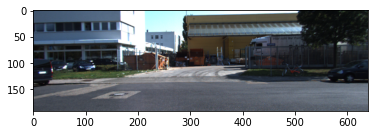

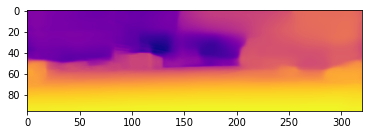

Epoch [10/50][11/438], 7.05 sec(s), Batch loss:1.91503 (Avg:1.78560)
Epoch [10/50][21/438], 6.84 sec(s), Batch loss:1.86451 (Avg:1.86442)
Epoch [10/50][31/438], 6.75 sec(s), Batch loss:1.90921 (Avg:1.90722)
Epoch [10/50][41/438], 6.70 sec(s), Batch loss:2.25003 (Avg:1.94225)
Epoch [10/50][51/438], 6.67 sec(s), Batch loss:1.48983 (Avg:1.93945)
Epoch [10/50][61/438], 6.65 sec(s), Batch loss:1.67172 (Avg:1.92336)
Epoch [10/50][71/438], 6.63 sec(s), Batch loss:1.92918 (Avg:1.92027)
Epoch [10/50][81/438], 6.65 sec(s), Batch loss:2.02756 (Avg:1.91374)
Epoch [10/50][91/438], 6.66 sec(s), Batch loss:1.91455 (Avg:1.91260)
Epoch [10/50][101/438], 6.68 sec(s), Batch loss:1.91054 (Avg:1.89831)
Epoch [10/50][111/438], 6.69 sec(s), Batch loss:1.81787 (Avg:1.90011)
Epoch [10/50][121/438], 6.68 sec(s), Batch loss:1.97290 (Avg:1.89511)
Epoch [10/50][131/438], 6.67 sec(s), Batch loss:1.56039 (Avg:1.89449)
Epoch [10/50][141/438], 6.66 sec(s), Batch loss:2.08962 (Avg:1.90098)
Epoch [10/50][151/438], 6.66 

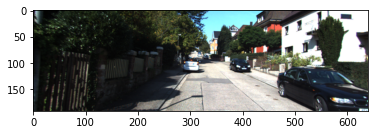

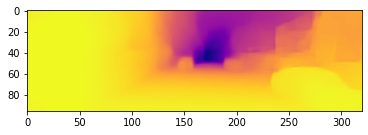

Epoch [10/50][411/438], 6.67 sec(s), Batch loss:2.19710 (Avg:1.96196)
Epoch [10/50][421/438], 6.67 sec(s), Batch loss:1.72386 (Avg:1.95928)
Epoch [10/50][431/438], 6.67 sec(s), Batch loss:2.34514 (Avg:1.95815)


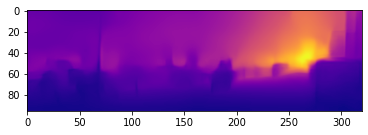

Epoch [10/50], 303.48 sec(s), Avg Train loss:1.95749, Avg Test loss:5.38453
Epoch [11/50][1/438], 6.94 sec(s), Batch loss:1.74734 (Avg:1.74734)


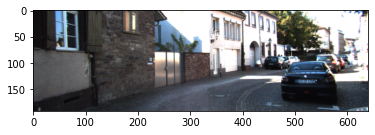

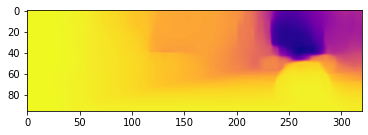

Epoch [11/50][11/438], 6.86 sec(s), Batch loss:1.50408 (Avg:1.77119)
Epoch [11/50][21/438], 6.74 sec(s), Batch loss:1.86910 (Avg:1.86078)
Epoch [11/50][31/438], 6.68 sec(s), Batch loss:1.74823 (Avg:1.86970)
Epoch [11/50][41/438], 6.65 sec(s), Batch loss:2.02738 (Avg:1.86156)
Epoch [11/50][51/438], 6.64 sec(s), Batch loss:1.63280 (Avg:1.85671)
Epoch [11/50][61/438], 6.62 sec(s), Batch loss:2.05318 (Avg:1.85284)
Epoch [11/50][71/438], 6.64 sec(s), Batch loss:1.75388 (Avg:1.87099)
Epoch [11/50][81/438], 6.65 sec(s), Batch loss:1.81587 (Avg:1.87352)
Epoch [11/50][91/438], 6.67 sec(s), Batch loss:1.69780 (Avg:1.88623)
Epoch [11/50][101/438], 6.68 sec(s), Batch loss:2.07597 (Avg:1.87698)
Epoch [11/50][111/438], 6.67 sec(s), Batch loss:1.87284 (Avg:1.88946)
Epoch [11/50][121/438], 6.66 sec(s), Batch loss:1.60436 (Avg:1.88733)
Epoch [11/50][131/438], 6.65 sec(s), Batch loss:2.05196 (Avg:1.88078)
Epoch [11/50][141/438], 6.65 sec(s), Batch loss:2.86265 (Avg:1.90719)
Epoch [11/50][151/438], 6.64 

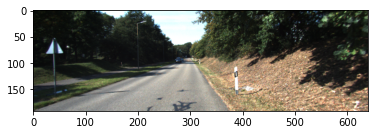

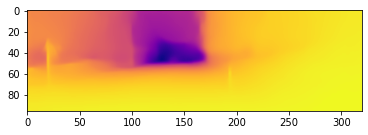

Epoch [11/50][411/438], 6.66 sec(s), Batch loss:1.73694 (Avg:1.92434)
Epoch [11/50][421/438], 6.67 sec(s), Batch loss:1.52481 (Avg:1.92266)
Epoch [11/50][431/438], 6.67 sec(s), Batch loss:1.77673 (Avg:1.92407)


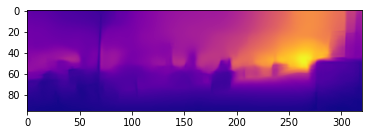

Epoch [11/50], 303.46 sec(s), Avg Train loss:1.92325, Avg Test loss:5.52526
Epoch [12/50][1/438], 6.59 sec(s), Batch loss:2.21477 (Avg:2.21477)


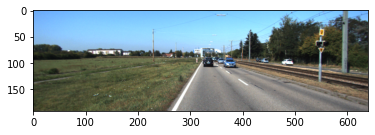

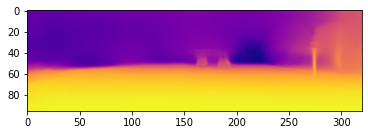

Epoch [12/50][11/438], 6.85 sec(s), Batch loss:1.86042 (Avg:2.01582)
Epoch [12/50][21/438], 6.72 sec(s), Batch loss:2.26998 (Avg:1.98315)
Epoch [12/50][31/438], 6.67 sec(s), Batch loss:1.52201 (Avg:2.01711)
Epoch [12/50][41/438], 6.64 sec(s), Batch loss:2.09012 (Avg:2.02706)
Epoch [12/50][51/438], 6.62 sec(s), Batch loss:2.05589 (Avg:2.00151)
Epoch [12/50][61/438], 6.64 sec(s), Batch loss:2.65441 (Avg:2.01216)
Epoch [12/50][71/438], 6.66 sec(s), Batch loss:1.56705 (Avg:1.98798)
Epoch [12/50][81/438], 6.68 sec(s), Batch loss:1.91616 (Avg:1.99062)
Epoch [12/50][91/438], 6.69 sec(s), Batch loss:2.27992 (Avg:1.99200)
Epoch [12/50][101/438], 6.68 sec(s), Batch loss:1.89835 (Avg:1.98201)
Epoch [12/50][111/438], 6.67 sec(s), Batch loss:1.75015 (Avg:1.99262)
Epoch [12/50][121/438], 6.66 sec(s), Batch loss:1.91500 (Avg:1.99642)
Epoch [12/50][131/438], 6.66 sec(s), Batch loss:2.21772 (Avg:2.00844)
Epoch [12/50][141/438], 6.65 sec(s), Batch loss:2.07592 (Avg:2.00873)
Epoch [12/50][151/438], 6.64 

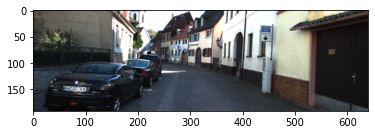

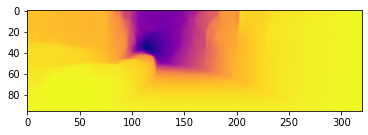

Epoch [12/50][411/438], 6.67 sec(s), Batch loss:1.72741 (Avg:1.96840)
Epoch [12/50][421/438], 6.67 sec(s), Batch loss:1.63244 (Avg:1.96337)
Epoch [12/50][431/438], 6.67 sec(s), Batch loss:1.67387 (Avg:1.95825)


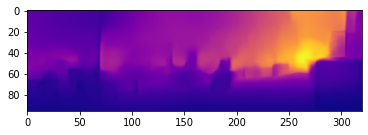

Epoch [12/50], 303.05 sec(s), Avg Train loss:1.95776, Avg Test loss:5.76849
Epoch [13/50][1/438], 6.92 sec(s), Batch loss:1.83624 (Avg:1.83624)


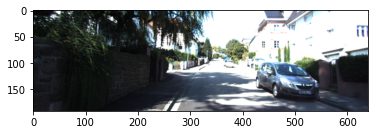

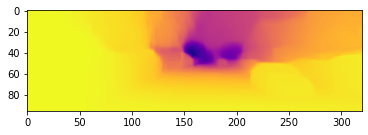

Epoch [13/50][11/438], 7.20 sec(s), Batch loss:2.58874 (Avg:1.99719)
Epoch [13/50][21/438], 7.06 sec(s), Batch loss:2.33750 (Avg:1.98480)
Epoch [13/50][31/438], 7.01 sec(s), Batch loss:1.64343 (Avg:1.90469)
Epoch [13/50][41/438], 6.95 sec(s), Batch loss:2.10382 (Avg:1.83919)
Epoch [13/50][51/438], 6.94 sec(s), Batch loss:1.76469 (Avg:1.82262)
Epoch [13/50][61/438], 6.93 sec(s), Batch loss:2.14188 (Avg:1.82102)
Epoch [13/50][71/438], 6.91 sec(s), Batch loss:1.68125 (Avg:1.82438)
Epoch [13/50][81/438], 6.91 sec(s), Batch loss:2.08896 (Avg:1.83935)
Epoch [13/50][91/438], 6.89 sec(s), Batch loss:1.91916 (Avg:1.84642)
Epoch [13/50][101/438], 6.87 sec(s), Batch loss:1.94766 (Avg:1.86029)
Epoch [13/50][111/438], 6.86 sec(s), Batch loss:1.73094 (Avg:1.85020)
Epoch [13/50][121/438], 6.84 sec(s), Batch loss:2.06365 (Avg:1.84725)
Epoch [13/50][131/438], 6.82 sec(s), Batch loss:1.60830 (Avg:1.83265)
Epoch [13/50][141/438], 6.80 sec(s), Batch loss:1.59190 (Avg:1.81615)
Epoch [13/50][151/438], 6.81 

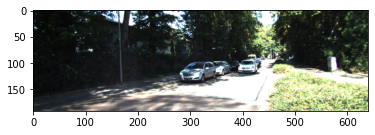

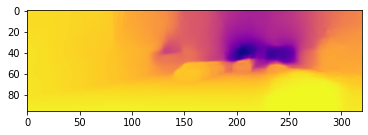

Epoch [13/50][411/438], 6.72 sec(s), Batch loss:1.65981 (Avg:1.83122)
Epoch [13/50][421/438], 6.72 sec(s), Batch loss:1.66739 (Avg:1.82841)
Epoch [13/50][431/438], 6.71 sec(s), Batch loss:1.85579 (Avg:1.82799)


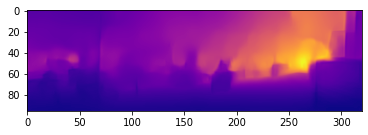

Epoch [13/50], 305.17 sec(s), Avg Train loss:1.82634, Avg Test loss:5.48826
Epoch [14/50][1/438], 6.89 sec(s), Batch loss:1.77666 (Avg:1.77666)


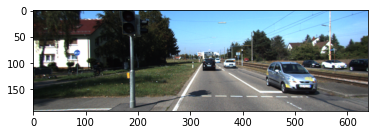

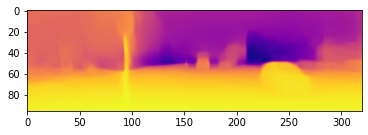

Epoch [14/50][11/438], 7.09 sec(s), Batch loss:2.17651 (Avg:1.81489)
Epoch [14/50][21/438], 6.95 sec(s), Batch loss:2.12868 (Avg:1.82688)
Epoch [14/50][31/438], 6.82 sec(s), Batch loss:2.35583 (Avg:1.85490)
Epoch [14/50][41/438], 6.80 sec(s), Batch loss:1.54400 (Avg:1.84881)
Epoch [14/50][51/438], 6.80 sec(s), Batch loss:1.88780 (Avg:1.82201)
Epoch [14/50][61/438], 6.80 sec(s), Batch loss:1.56695 (Avg:1.78214)
Epoch [14/50][71/438], 6.79 sec(s), Batch loss:1.78544 (Avg:1.76835)
Epoch [14/50][81/438], 6.76 sec(s), Batch loss:1.71479 (Avg:1.77638)
Epoch [14/50][91/438], 6.74 sec(s), Batch loss:1.45202 (Avg:1.76471)
Epoch [14/50][101/438], 6.72 sec(s), Batch loss:1.69168 (Avg:1.75563)
Epoch [14/50][111/438], 6.71 sec(s), Batch loss:1.94077 (Avg:1.75073)
Epoch [14/50][121/438], 6.69 sec(s), Batch loss:1.59915 (Avg:1.74412)
Epoch [14/50][131/438], 6.68 sec(s), Batch loss:1.56383 (Avg:1.74133)
Epoch [14/50][141/438], 6.69 sec(s), Batch loss:1.81810 (Avg:1.74118)
Epoch [14/50][151/438], 6.70 

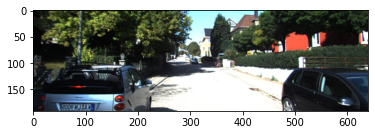

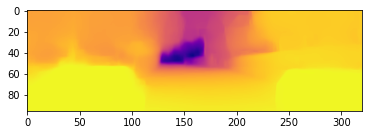

Epoch [14/50][411/438], 6.67 sec(s), Batch loss:2.63567 (Avg:1.77859)
Epoch [14/50][421/438], 6.67 sec(s), Batch loss:1.89345 (Avg:1.78352)
Epoch [14/50][431/438], 6.67 sec(s), Batch loss:1.53102 (Avg:1.78225)


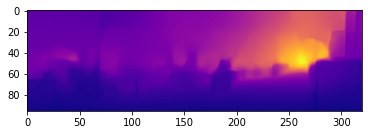

Epoch [14/50], 303.59 sec(s), Avg Train loss:1.78078, Avg Test loss:5.43789
Epoch [15/50][1/438], 6.86 sec(s), Batch loss:1.54601 (Avg:1.54601)


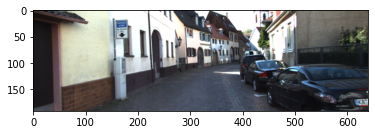

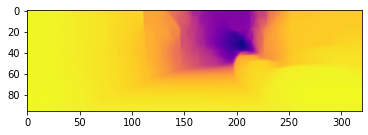

Epoch [15/50][11/438], 7.07 sec(s), Batch loss:1.94461 (Avg:1.75172)
Epoch [15/50][21/438], 6.92 sec(s), Batch loss:1.45540 (Avg:1.73811)
Epoch [15/50][31/438], 6.83 sec(s), Batch loss:1.43459 (Avg:1.70724)
Epoch [15/50][41/438], 6.79 sec(s), Batch loss:2.54999 (Avg:1.76242)
Epoch [15/50][51/438], 6.76 sec(s), Batch loss:1.91033 (Avg:1.82319)
Epoch [15/50][61/438], 6.72 sec(s), Batch loss:1.99341 (Avg:1.81362)
Epoch [15/50][71/438], 6.71 sec(s), Batch loss:1.54883 (Avg:1.79337)
Epoch [15/50][81/438], 6.74 sec(s), Batch loss:2.02681 (Avg:1.80791)
Epoch [15/50][91/438], 6.74 sec(s), Batch loss:1.76203 (Avg:1.80724)
Epoch [15/50][101/438], 6.75 sec(s), Batch loss:1.92527 (Avg:1.80387)
Epoch [15/50][111/438], 6.76 sec(s), Batch loss:1.43752 (Avg:1.79067)
Epoch [15/50][121/438], 6.74 sec(s), Batch loss:1.95353 (Avg:1.79313)
Epoch [15/50][131/438], 6.74 sec(s), Batch loss:1.82791 (Avg:1.81034)
Epoch [15/50][141/438], 6.74 sec(s), Batch loss:2.06112 (Avg:1.83766)
Epoch [15/50][151/438], 6.75 

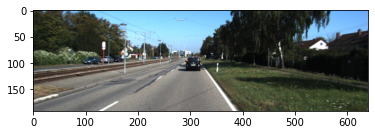

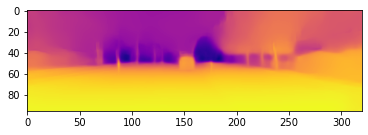

Epoch [15/50][411/438], 6.67 sec(s), Batch loss:1.78173 (Avg:1.79923)
Epoch [15/50][421/438], 6.67 sec(s), Batch loss:1.99581 (Avg:1.79654)
Epoch [15/50][431/438], 6.68 sec(s), Batch loss:1.65877 (Avg:1.79474)


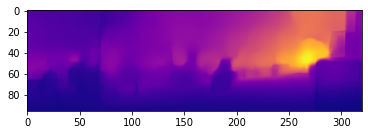

Epoch [15/50], 303.76 sec(s), Avg Train loss:1.79684, Avg Test loss:5.42200
Epoch [16/50][1/438], 6.91 sec(s), Batch loss:1.77576 (Avg:1.77576)


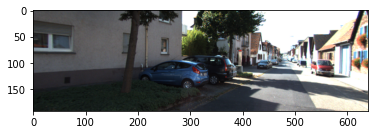

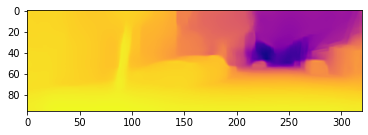

Epoch [16/50][11/438], 6.88 sec(s), Batch loss:2.00939 (Avg:1.88878)
Epoch [16/50][21/438], 6.71 sec(s), Batch loss:1.34817 (Avg:1.89125)
Epoch [16/50][31/438], 6.66 sec(s), Batch loss:1.74595 (Avg:1.87988)
Epoch [16/50][41/438], 6.62 sec(s), Batch loss:1.61583 (Avg:1.83957)
Epoch [16/50][51/438], 6.61 sec(s), Batch loss:1.71389 (Avg:1.79392)
Epoch [16/50][61/438], 6.60 sec(s), Batch loss:1.90379 (Avg:1.79169)
Epoch [16/50][71/438], 6.61 sec(s), Batch loss:1.64651 (Avg:1.76519)
Epoch [16/50][81/438], 6.63 sec(s), Batch loss:2.04722 (Avg:1.75107)
Epoch [16/50][91/438], 6.65 sec(s), Batch loss:1.94531 (Avg:1.74946)
Epoch [16/50][101/438], 6.66 sec(s), Batch loss:1.75075 (Avg:1.74691)
Epoch [16/50][111/438], 6.65 sec(s), Batch loss:1.84617 (Avg:1.74015)
Epoch [16/50][121/438], 6.66 sec(s), Batch loss:1.44052 (Avg:1.72885)
Epoch [16/50][131/438], 6.67 sec(s), Batch loss:1.77206 (Avg:1.72543)
Epoch [16/50][141/438], 6.67 sec(s), Batch loss:1.49517 (Avg:1.72385)
Epoch [16/50][151/438], 6.68 

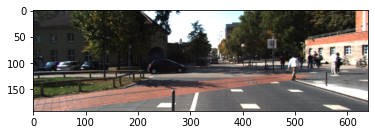

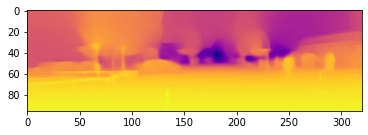

Epoch [16/50][411/438], 6.64 sec(s), Batch loss:2.05979 (Avg:1.69027)
Epoch [16/50][421/438], 6.64 sec(s), Batch loss:1.70254 (Avg:1.68925)
Epoch [16/50][431/438], 6.65 sec(s), Batch loss:2.26167 (Avg:1.69074)


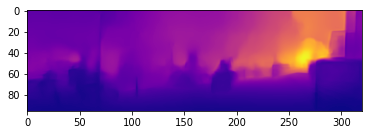

Epoch [16/50], 302.53 sec(s), Avg Train loss:1.69240, Avg Test loss:5.28339
Epoch [17/50][1/438], 6.68 sec(s), Batch loss:1.85745 (Avg:1.85745)


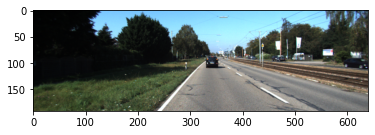

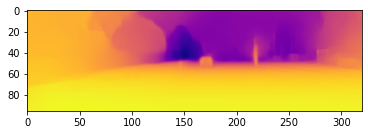

Epoch [17/50][11/438], 6.79 sec(s), Batch loss:1.68407 (Avg:1.74278)
Epoch [17/50][21/438], 6.67 sec(s), Batch loss:2.22975 (Avg:1.71070)
Epoch [17/50][31/438], 6.62 sec(s), Batch loss:1.68081 (Avg:1.68707)
Epoch [17/50][41/438], 6.60 sec(s), Batch loss:1.53354 (Avg:1.65867)
Epoch [17/50][51/438], 6.59 sec(s), Batch loss:1.94637 (Avg:1.64337)
Epoch [17/50][61/438], 6.60 sec(s), Batch loss:1.52883 (Avg:1.66133)
Epoch [17/50][71/438], 6.62 sec(s), Batch loss:1.31932 (Avg:1.66664)
Epoch [17/50][81/438], 6.64 sec(s), Batch loss:1.77894 (Avg:1.67216)
Epoch [17/50][91/438], 6.66 sec(s), Batch loss:1.88086 (Avg:1.68209)
Epoch [17/50][101/438], 6.66 sec(s), Batch loss:1.77826 (Avg:1.67506)
Epoch [17/50][111/438], 6.65 sec(s), Batch loss:1.55535 (Avg:1.66607)
Epoch [17/50][121/438], 6.64 sec(s), Batch loss:2.05705 (Avg:1.67760)
Epoch [17/50][131/438], 6.63 sec(s), Batch loss:1.55945 (Avg:1.68437)
Epoch [17/50][141/438], 6.62 sec(s), Batch loss:1.42484 (Avg:1.68290)
Epoch [17/50][151/438], 6.62 

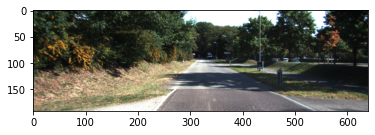

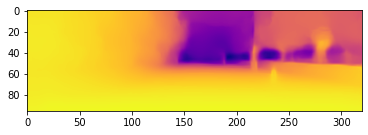

Epoch [17/50][411/438], 6.64 sec(s), Batch loss:1.55896 (Avg:1.65102)
Epoch [17/50][421/438], 6.65 sec(s), Batch loss:1.67391 (Avg:1.64987)
Epoch [17/50][431/438], 6.65 sec(s), Batch loss:1.85705 (Avg:1.65298)


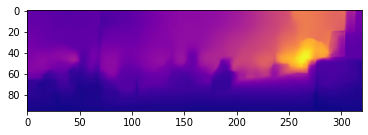

Epoch [17/50], 302.35 sec(s), Avg Train loss:1.65408, Avg Test loss:5.49058
Epoch [18/50][1/438], 6.67 sec(s), Batch loss:1.57512 (Avg:1.57512)


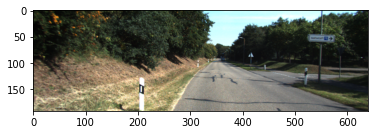

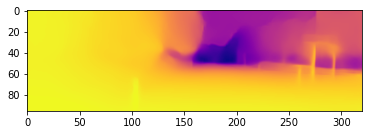

Epoch [18/50][11/438], 6.83 sec(s), Batch loss:1.53417 (Avg:1.57595)
Epoch [18/50][21/438], 6.71 sec(s), Batch loss:1.54536 (Avg:1.61755)
Epoch [18/50][31/438], 6.65 sec(s), Batch loss:1.49921 (Avg:1.63919)
Epoch [18/50][41/438], 6.63 sec(s), Batch loss:2.52932 (Avg:1.69998)
Epoch [18/50][51/438], 6.62 sec(s), Batch loss:1.76819 (Avg:1.75217)
Epoch [18/50][61/438], 6.65 sec(s), Batch loss:2.68658 (Avg:1.77123)
Epoch [18/50][71/438], 6.67 sec(s), Batch loss:1.50249 (Avg:1.75904)
Epoch [18/50][81/438], 6.68 sec(s), Batch loss:1.65723 (Avg:1.75063)
Epoch [18/50][91/438], 6.68 sec(s), Batch loss:1.27585 (Avg:1.74170)
Epoch [18/50][101/438], 6.66 sec(s), Batch loss:2.18754 (Avg:1.75130)
Epoch [18/50][111/438], 6.65 sec(s), Batch loss:1.52875 (Avg:1.73824)
Epoch [18/50][121/438], 6.64 sec(s), Batch loss:1.93697 (Avg:1.74246)
Epoch [18/50][131/438], 6.63 sec(s), Batch loss:1.37335 (Avg:1.74488)
Epoch [18/50][141/438], 6.63 sec(s), Batch loss:2.07850 (Avg:1.75382)
Epoch [18/50][151/438], 6.63 

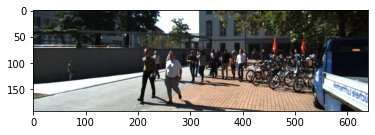

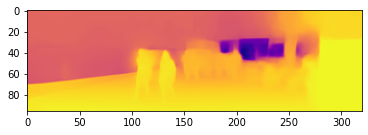

Epoch [18/50][411/438], 6.65 sec(s), Batch loss:1.56490 (Avg:1.68340)
Epoch [18/50][421/438], 6.65 sec(s), Batch loss:1.84036 (Avg:1.68320)
Epoch [18/50][431/438], 6.66 sec(s), Batch loss:1.57184 (Avg:1.68374)


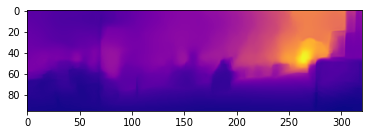

Epoch [18/50], 302.14 sec(s), Avg Train loss:1.68157, Avg Test loss:5.48553
Epoch [19/50][1/438], 6.69 sec(s), Batch loss:1.29502 (Avg:1.29502)


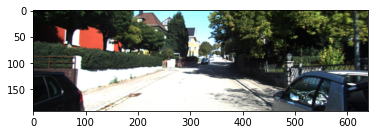

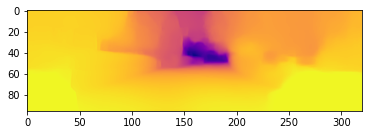

Epoch [19/50][11/438], 6.83 sec(s), Batch loss:1.36470 (Avg:1.58787)
Epoch [19/50][21/438], 6.69 sec(s), Batch loss:1.50755 (Avg:1.56181)
Epoch [19/50][31/438], 6.64 sec(s), Batch loss:1.61080 (Avg:1.56276)
Epoch [19/50][41/438], 6.61 sec(s), Batch loss:1.53810 (Avg:1.56543)
Epoch [19/50][51/438], 6.65 sec(s), Batch loss:1.49858 (Avg:1.56356)
Epoch [19/50][61/438], 6.67 sec(s), Batch loss:1.61245 (Avg:1.56934)
Epoch [19/50][71/438], 6.68 sec(s), Batch loss:1.55519 (Avg:1.55360)
Epoch [19/50][81/438], 6.69 sec(s), Batch loss:2.06204 (Avg:1.56549)
Epoch [19/50][91/438], 6.67 sec(s), Batch loss:1.98288 (Avg:1.57431)
Epoch [19/50][101/438], 6.66 sec(s), Batch loss:1.65665 (Avg:1.58860)
Epoch [19/50][111/438], 6.65 sec(s), Batch loss:1.45914 (Avg:1.59981)
Epoch [19/50][121/438], 6.64 sec(s), Batch loss:1.65802 (Avg:1.61162)
Epoch [19/50][131/438], 6.63 sec(s), Batch loss:1.69901 (Avg:1.60761)
Epoch [19/50][141/438], 6.63 sec(s), Batch loss:1.60923 (Avg:1.60474)
Epoch [19/50][151/438], 6.64 

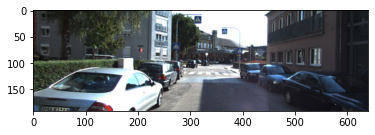

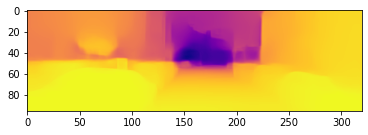

Epoch [19/50][411/438], 6.65 sec(s), Batch loss:1.72805 (Avg:1.59095)
Epoch [19/50][421/438], 6.65 sec(s), Batch loss:1.76440 (Avg:1.59228)
Epoch [19/50][431/438], 6.65 sec(s), Batch loss:1.86072 (Avg:1.60053)


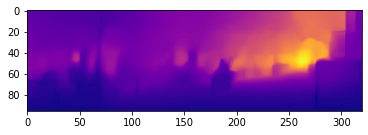

Epoch [19/50], 302.05 sec(s), Avg Train loss:1.60980, Avg Test loss:5.40993
Epoch [20/50][1/438], 6.62 sec(s), Batch loss:2.09938 (Avg:2.09938)


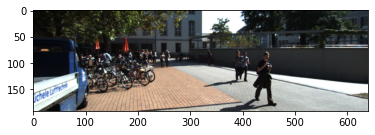

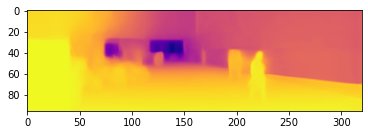

Epoch [20/50][11/438], 6.87 sec(s), Batch loss:2.02478 (Avg:1.78049)
Epoch [20/50][21/438], 6.72 sec(s), Batch loss:1.43018 (Avg:1.87871)
Epoch [20/50][31/438], 6.65 sec(s), Batch loss:1.58352 (Avg:1.80903)
Epoch [20/50][41/438], 6.66 sec(s), Batch loss:1.83629 (Avg:1.78117)
Epoch [20/50][51/438], 6.69 sec(s), Batch loss:1.65711 (Avg:1.73306)
Epoch [20/50][61/438], 6.70 sec(s), Batch loss:1.39768 (Avg:1.71099)
Epoch [20/50][71/438], 6.71 sec(s), Batch loss:1.59291 (Avg:1.67840)
Epoch [20/50][81/438], 6.69 sec(s), Batch loss:1.39925 (Avg:1.67801)
Epoch [20/50][91/438], 6.68 sec(s), Batch loss:1.64657 (Avg:1.65841)
Epoch [20/50][101/438], 6.66 sec(s), Batch loss:1.49626 (Avg:1.63637)
Epoch [20/50][111/438], 6.65 sec(s), Batch loss:1.82815 (Avg:1.63307)
Epoch [20/50][121/438], 6.64 sec(s), Batch loss:1.42569 (Avg:1.62551)
Epoch [20/50][131/438], 6.63 sec(s), Batch loss:1.72257 (Avg:1.62026)
Epoch [20/50][141/438], 6.64 sec(s), Batch loss:1.72010 (Avg:1.61578)
Epoch [20/50][151/438], 6.65 

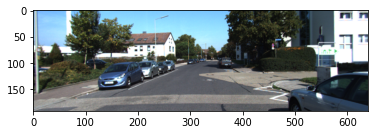

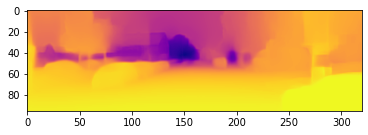

Epoch [20/50][411/438], 6.65 sec(s), Batch loss:1.84469 (Avg:1.58385)
Epoch [20/50][421/438], 6.65 sec(s), Batch loss:1.33693 (Avg:1.58266)
Epoch [20/50][431/438], 6.65 sec(s), Batch loss:1.72587 (Avg:1.58548)


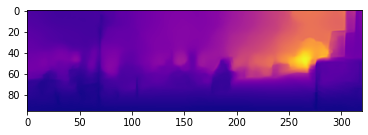

Epoch [20/50], 301.97 sec(s), Avg Train loss:1.58495, Avg Test loss:5.90668
Epoch [21/50][1/438], 6.66 sec(s), Batch loss:1.61690 (Avg:1.61690)


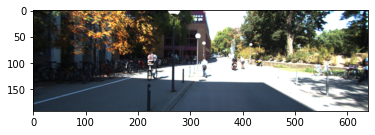

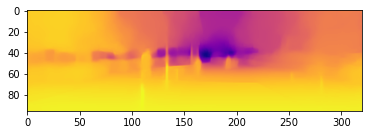

Epoch [21/50][11/438], 6.78 sec(s), Batch loss:2.02523 (Avg:1.62129)
Epoch [21/50][21/438], 6.65 sec(s), Batch loss:1.94227 (Avg:1.66084)
Epoch [21/50][31/438], 6.65 sec(s), Batch loss:1.18436 (Avg:1.63311)
Epoch [21/50][41/438], 6.68 sec(s), Batch loss:1.91812 (Avg:1.62717)
Epoch [21/50][51/438], 6.70 sec(s), Batch loss:1.59184 (Avg:1.62297)
Epoch [21/50][61/438], 6.71 sec(s), Batch loss:1.46025 (Avg:1.59852)
Epoch [21/50][71/438], 6.69 sec(s), Batch loss:1.53073 (Avg:1.58417)
Epoch [21/50][81/438], 6.67 sec(s), Batch loss:1.51561 (Avg:1.57733)
Epoch [21/50][91/438], 6.66 sec(s), Batch loss:1.40680 (Avg:1.56946)
Epoch [21/50][101/438], 6.65 sec(s), Batch loss:1.42091 (Avg:1.55713)
Epoch [21/50][111/438], 6.64 sec(s), Batch loss:1.83145 (Avg:1.55667)
Epoch [21/50][121/438], 6.63 sec(s), Batch loss:1.46020 (Avg:1.55517)
Epoch [21/50][131/438], 6.63 sec(s), Batch loss:1.72873 (Avg:1.55184)
Epoch [21/50][141/438], 6.64 sec(s), Batch loss:1.30484 (Avg:1.55034)
Epoch [21/50][151/438], 6.65 

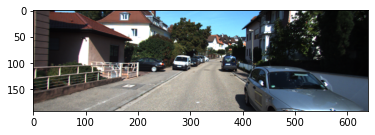

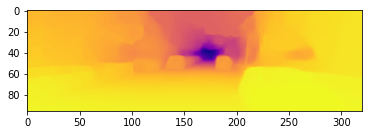

Epoch [21/50][411/438], 6.65 sec(s), Batch loss:1.51705 (Avg:1.55755)
Epoch [21/50][421/438], 6.65 sec(s), Batch loss:1.97228 (Avg:1.55640)
Epoch [21/50][431/438], 6.65 sec(s), Batch loss:2.32591 (Avg:1.56116)


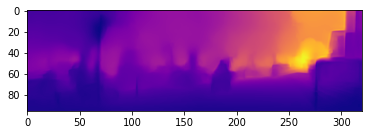

Epoch [21/50], 301.65 sec(s), Avg Train loss:1.56231, Avg Test loss:5.87802
Epoch [22/50][1/438], 6.60 sec(s), Batch loss:2.10814 (Avg:2.10814)


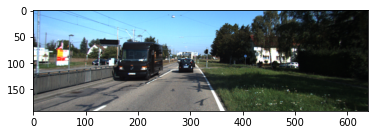

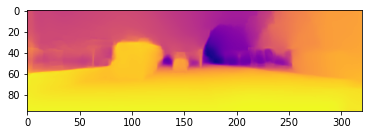

Epoch [22/50][11/438], 6.76 sec(s), Batch loss:1.74788 (Avg:1.59477)
Epoch [22/50][21/438], 6.67 sec(s), Batch loss:1.75720 (Avg:1.61268)
Epoch [22/50][31/438], 6.72 sec(s), Batch loss:1.28826 (Avg:1.58454)
Epoch [22/50][41/438], 6.74 sec(s), Batch loss:1.44808 (Avg:1.56942)
Epoch [22/50][51/438], 6.75 sec(s), Batch loss:1.49601 (Avg:1.57893)
Epoch [22/50][61/438], 6.75 sec(s), Batch loss:1.41693 (Avg:1.57119)
Epoch [22/50][71/438], 6.72 sec(s), Batch loss:1.39238 (Avg:1.56226)
Epoch [22/50][81/438], 6.70 sec(s), Batch loss:1.60030 (Avg:1.55955)
Epoch [22/50][91/438], 6.68 sec(s), Batch loss:1.39864 (Avg:1.54773)
Epoch [22/50][101/438], 6.66 sec(s), Batch loss:1.78078 (Avg:1.54219)
Epoch [22/50][111/438], 6.65 sec(s), Batch loss:1.28805 (Avg:1.53313)
Epoch [22/50][121/438], 6.64 sec(s), Batch loss:1.84753 (Avg:1.53056)
Epoch [22/50][131/438], 6.65 sec(s), Batch loss:2.03580 (Avg:1.54145)
Epoch [22/50][141/438], 6.66 sec(s), Batch loss:1.72586 (Avg:1.54482)
Epoch [22/50][151/438], 6.67 

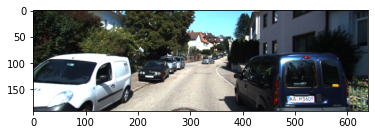

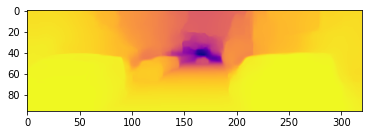

Epoch [22/50][411/438], 6.67 sec(s), Batch loss:1.33660 (Avg:1.54667)
Epoch [22/50][421/438], 6.66 sec(s), Batch loss:1.83046 (Avg:1.54646)
Epoch [22/50][431/438], 6.66 sec(s), Batch loss:1.42103 (Avg:1.54753)


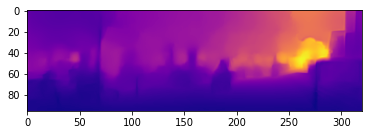

Epoch [22/50], 302.34 sec(s), Avg Train loss:1.54712, Avg Test loss:5.37097
Epoch [23/50][1/438], 6.78 sec(s), Batch loss:1.48235 (Avg:1.48235)


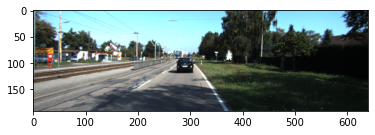

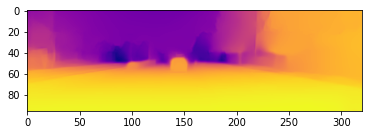

Epoch [23/50][11/438], 6.80 sec(s), Batch loss:1.33577 (Avg:1.44887)
Epoch [23/50][21/438], 6.77 sec(s), Batch loss:1.64696 (Avg:1.42240)
Epoch [23/50][31/438], 6.77 sec(s), Batch loss:1.40574 (Avg:1.43058)
Epoch [23/50][41/438], 6.78 sec(s), Batch loss:1.29878 (Avg:1.43505)
Epoch [23/50][51/438], 6.79 sec(s), Batch loss:1.34541 (Avg:1.41907)
Epoch [23/50][61/438], 6.76 sec(s), Batch loss:1.25986 (Avg:1.42331)
Epoch [23/50][71/438], 6.73 sec(s), Batch loss:1.52097 (Avg:1.43898)
Epoch [23/50][81/438], 6.71 sec(s), Batch loss:1.45672 (Avg:1.44192)
Epoch [23/50][91/438], 6.69 sec(s), Batch loss:1.36177 (Avg:1.44192)
Epoch [23/50][101/438], 6.67 sec(s), Batch loss:1.33827 (Avg:1.44823)
Epoch [23/50][111/438], 6.66 sec(s), Batch loss:1.30327 (Avg:1.44398)
Epoch [23/50][121/438], 6.67 sec(s), Batch loss:1.14669 (Avg:1.44777)
Epoch [23/50][131/438], 6.67 sec(s), Batch loss:1.55628 (Avg:1.46718)
Epoch [23/50][141/438], 6.68 sec(s), Batch loss:1.37889 (Avg:1.47815)
Epoch [23/50][151/438], 6.69 

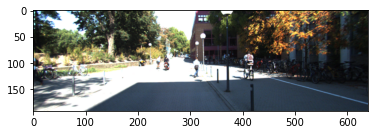

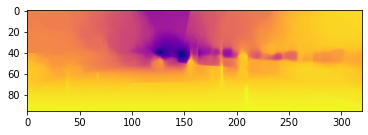

Epoch [23/50][411/438], 6.67 sec(s), Batch loss:1.48393 (Avg:1.52130)
Epoch [23/50][421/438], 6.66 sec(s), Batch loss:1.48023 (Avg:1.52461)
Epoch [23/50][431/438], 6.66 sec(s), Batch loss:1.75418 (Avg:1.52413)


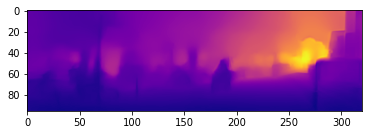

Epoch [23/50], 302.46 sec(s), Avg Train loss:1.52656, Avg Test loss:5.53025
Epoch [24/50][1/438], 6.68 sec(s), Batch loss:1.52942 (Avg:1.52942)


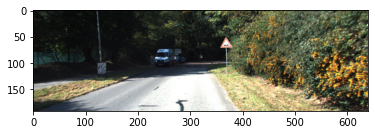

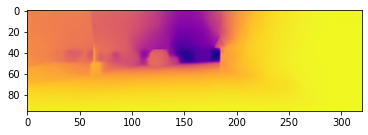

Epoch [24/50][11/438], 6.92 sec(s), Batch loss:2.24069 (Avg:1.60941)
Epoch [24/50][21/438], 6.84 sec(s), Batch loss:1.43406 (Avg:1.55532)
Epoch [24/50][31/438], 6.81 sec(s), Batch loss:1.44814 (Avg:1.48534)
Epoch [24/50][41/438], 6.80 sec(s), Batch loss:1.53148 (Avg:1.49019)
Epoch [24/50][51/438], 6.76 sec(s), Batch loss:1.66768 (Avg:1.50927)
Epoch [24/50][61/438], 6.72 sec(s), Batch loss:1.87609 (Avg:1.51722)
Epoch [24/50][71/438], 6.70 sec(s), Batch loss:1.41036 (Avg:1.52210)
Epoch [24/50][81/438], 6.68 sec(s), Batch loss:1.97205 (Avg:1.52942)
Epoch [24/50][91/438], 6.67 sec(s), Batch loss:1.41875 (Avg:1.53249)
Epoch [24/50][101/438], 6.65 sec(s), Batch loss:1.66071 (Avg:1.53569)
Epoch [24/50][111/438], 6.66 sec(s), Batch loss:1.27258 (Avg:1.52741)
Epoch [24/50][121/438], 6.67 sec(s), Batch loss:1.68218 (Avg:1.51413)
Epoch [24/50][131/438], 6.68 sec(s), Batch loss:1.44515 (Avg:1.51086)
Epoch [24/50][141/438], 6.68 sec(s), Batch loss:1.58115 (Avg:1.51239)
Epoch [24/50][151/438], 6.68 

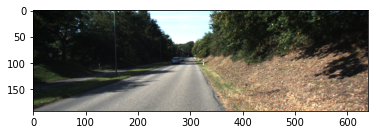

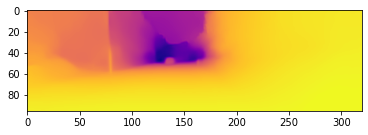

Epoch [24/50][411/438], 6.64 sec(s), Batch loss:1.36598 (Avg:1.51372)
Epoch [24/50][421/438], 6.65 sec(s), Batch loss:1.90567 (Avg:1.51672)
Epoch [24/50][431/438], 6.65 sec(s), Batch loss:1.86041 (Avg:1.52682)


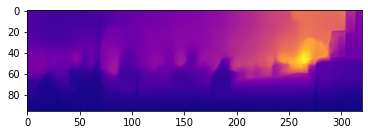

Epoch [24/50], 302.16 sec(s), Avg Train loss:1.53015, Avg Test loss:5.26978
Epoch [25/50][1/438], 7.06 sec(s), Batch loss:1.39641 (Avg:1.39641)


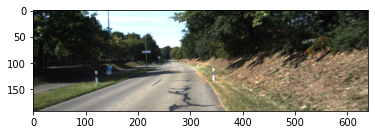

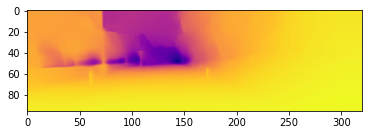

Epoch [25/50][11/438], 7.18 sec(s), Batch loss:2.22237 (Avg:1.58309)
Epoch [25/50][21/438], 7.00 sec(s), Batch loss:1.58274 (Avg:1.60940)
Epoch [25/50][31/438], 6.95 sec(s), Batch loss:1.43454 (Avg:1.57694)
Epoch [25/50][41/438], 6.89 sec(s), Batch loss:1.45570 (Avg:1.55167)
Epoch [25/50][51/438], 6.83 sec(s), Batch loss:2.35776 (Avg:1.55682)
Epoch [25/50][61/438], 6.79 sec(s), Batch loss:1.38519 (Avg:1.55249)
Epoch [25/50][71/438], 6.76 sec(s), Batch loss:1.53366 (Avg:1.55380)
Epoch [25/50][81/438], 6.74 sec(s), Batch loss:1.15670 (Avg:1.54366)
Epoch [25/50][91/438], 6.71 sec(s), Batch loss:1.30264 (Avg:1.53178)
Epoch [25/50][101/438], 6.71 sec(s), Batch loss:1.95799 (Avg:1.53330)
Epoch [25/50][111/438], 6.72 sec(s), Batch loss:1.82824 (Avg:1.53069)
Epoch [25/50][121/438], 6.73 sec(s), Batch loss:1.30910 (Avg:1.52889)
Epoch [25/50][131/438], 6.73 sec(s), Batch loss:1.24801 (Avg:1.52319)
Epoch [25/50][141/438], 6.72 sec(s), Batch loss:1.28903 (Avg:1.52518)
Epoch [25/50][151/438], 6.71 

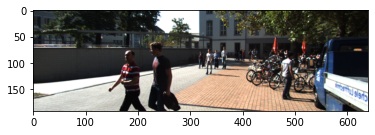

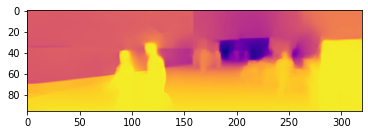

Epoch [25/50][411/438], 6.67 sec(s), Batch loss:1.56730 (Avg:1.46041)
Epoch [25/50][421/438], 6.68 sec(s), Batch loss:1.83458 (Avg:1.46463)
Epoch [25/50][431/438], 6.68 sec(s), Batch loss:1.42218 (Avg:1.46225)


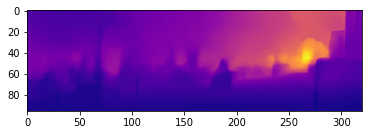

Epoch [25/50], 303.44 sec(s), Avg Train loss:1.46056, Avg Test loss:5.53131
Epoch [26/50][1/438], 7.05 sec(s), Batch loss:1.35252 (Avg:1.35252)


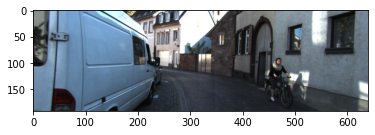

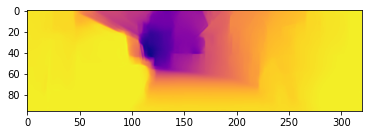

Epoch [26/50][11/438], 7.07 sec(s), Batch loss:1.80039 (Avg:1.46622)
Epoch [26/50][21/438], 6.94 sec(s), Batch loss:1.19347 (Avg:1.45086)
Epoch [26/50][31/438], 6.86 sec(s), Batch loss:1.34478 (Avg:1.39123)
Epoch [26/50][41/438], 6.79 sec(s), Batch loss:1.76311 (Avg:1.39321)
Epoch [26/50][51/438], 6.74 sec(s), Batch loss:1.36885 (Avg:1.40559)
Epoch [26/50][61/438], 6.71 sec(s), Batch loss:1.31092 (Avg:1.40503)
Epoch [26/50][71/438], 6.69 sec(s), Batch loss:1.18891 (Avg:1.39047)
Epoch [26/50][81/438], 6.68 sec(s), Batch loss:1.43968 (Avg:1.39029)
Epoch [26/50][91/438], 6.68 sec(s), Batch loss:1.42876 (Avg:1.39402)
Epoch [26/50][101/438], 6.69 sec(s), Batch loss:1.35851 (Avg:1.39450)
Epoch [26/50][111/438], 6.70 sec(s), Batch loss:1.16525 (Avg:1.39544)
Epoch [26/50][121/438], 6.71 sec(s), Batch loss:1.50834 (Avg:1.39543)
Epoch [26/50][131/438], 6.71 sec(s), Batch loss:1.37531 (Avg:1.39252)
Epoch [26/50][141/438], 6.70 sec(s), Batch loss:1.41759 (Avg:1.39657)
Epoch [26/50][151/438], 6.70 

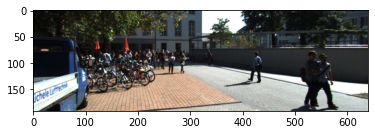

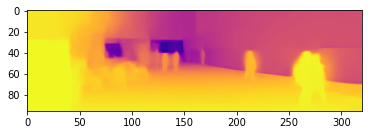

Epoch [26/50][411/438], 6.67 sec(s), Batch loss:1.94722 (Avg:1.42311)
Epoch [26/50][421/438], 6.67 sec(s), Batch loss:1.40951 (Avg:1.42279)
Epoch [26/50][431/438], 6.67 sec(s), Batch loss:1.39872 (Avg:1.42318)


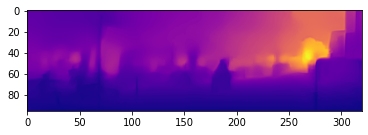

Epoch [26/50], 302.75 sec(s), Avg Train loss:1.42438, Avg Test loss:5.47119
Epoch [27/50][1/438], 6.56 sec(s), Batch loss:1.44357 (Avg:1.44357)


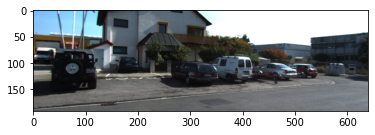

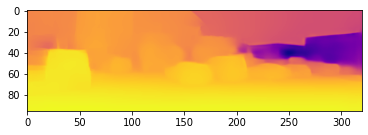

Epoch [27/50][11/438], 6.74 sec(s), Batch loss:1.42706 (Avg:1.46871)
Epoch [27/50][21/438], 6.64 sec(s), Batch loss:1.49679 (Avg:1.48307)
Epoch [27/50][31/438], 6.61 sec(s), Batch loss:1.52157 (Avg:1.44332)
Epoch [27/50][41/438], 6.65 sec(s), Batch loss:1.48713 (Avg:1.44368)
Epoch [27/50][51/438], 6.67 sec(s), Batch loss:1.22585 (Avg:1.44019)
Epoch [27/50][61/438], 6.69 sec(s), Batch loss:1.45397 (Avg:1.43142)
Epoch [27/50][71/438], 6.69 sec(s), Batch loss:1.31512 (Avg:1.42112)
Epoch [27/50][81/438], 6.68 sec(s), Batch loss:1.43858 (Avg:1.41331)
Epoch [27/50][91/438], 6.69 sec(s), Batch loss:1.58877 (Avg:1.41147)
Epoch [27/50][101/438], 6.70 sec(s), Batch loss:1.50461 (Avg:1.42852)
Epoch [27/50][111/438], 6.70 sec(s), Batch loss:1.89609 (Avg:1.44829)
Epoch [27/50][121/438], 6.71 sec(s), Batch loss:1.63724 (Avg:1.45142)
Epoch [27/50][131/438], 6.69 sec(s), Batch loss:1.58760 (Avg:1.46575)
Epoch [27/50][141/438], 6.68 sec(s), Batch loss:1.32943 (Avg:1.46274)
Epoch [27/50][151/438], 6.67 

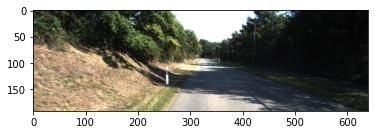

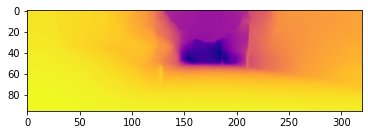

Epoch [27/50][411/438], 6.65 sec(s), Batch loss:1.52870 (Avg:1.43645)
Epoch [27/50][421/438], 6.65 sec(s), Batch loss:1.65148 (Avg:1.43684)
Epoch [27/50][431/438], 6.65 sec(s), Batch loss:1.58111 (Avg:1.43867)


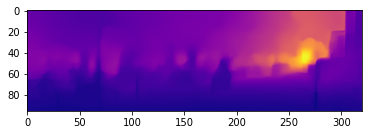

Epoch [27/50], 301.89 sec(s), Avg Train loss:1.43954, Avg Test loss:5.49326
Epoch [28/50][1/438], 6.64 sec(s), Batch loss:1.40531 (Avg:1.40531)


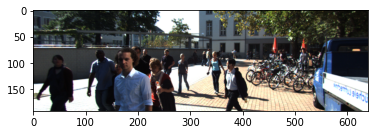

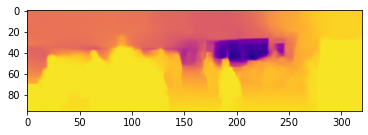

Epoch [28/50][11/438], 6.74 sec(s), Batch loss:1.56529 (Avg:1.34869)
Epoch [28/50][21/438], 6.64 sec(s), Batch loss:1.68596 (Avg:1.44349)
Epoch [28/50][31/438], 6.66 sec(s), Batch loss:1.55093 (Avg:1.44582)
Epoch [28/50][41/438], 6.69 sec(s), Batch loss:1.14502 (Avg:1.42017)
Epoch [28/50][51/438], 6.70 sec(s), Batch loss:1.31391 (Avg:1.41447)
Epoch [28/50][61/438], 6.71 sec(s), Batch loss:1.71651 (Avg:1.41548)
Epoch [28/50][71/438], 6.69 sec(s), Batch loss:1.38569 (Avg:1.41250)
Epoch [28/50][81/438], 6.70 sec(s), Batch loss:1.45420 (Avg:1.40932)
Epoch [28/50][91/438], 6.71 sec(s), Batch loss:1.25395 (Avg:1.39730)
Epoch [28/50][101/438], 6.71 sec(s), Batch loss:1.39384 (Avg:1.39648)
Epoch [28/50][111/438], 6.72 sec(s), Batch loss:1.34032 (Avg:1.40041)
Epoch [28/50][121/438], 6.71 sec(s), Batch loss:1.23603 (Avg:1.40004)
Epoch [28/50][131/438], 6.70 sec(s), Batch loss:1.16024 (Avg:1.39193)
Epoch [28/50][141/438], 6.69 sec(s), Batch loss:1.41358 (Avg:1.39408)
Epoch [28/50][151/438], 6.67 

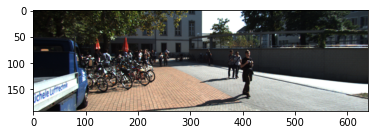

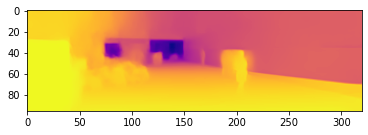

Epoch [28/50][411/438], 6.66 sec(s), Batch loss:1.40765 (Avg:1.39550)
Epoch [28/50][421/438], 6.65 sec(s), Batch loss:1.41266 (Avg:1.39579)
Epoch [28/50][431/438], 6.65 sec(s), Batch loss:1.07239 (Avg:1.39349)


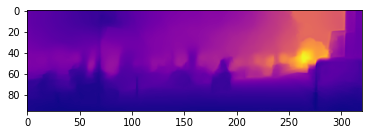

Epoch [28/50], 301.84 sec(s), Avg Train loss:1.39563, Avg Test loss:5.39157
Epoch [29/50][1/438], 6.67 sec(s), Batch loss:1.72161 (Avg:1.72161)


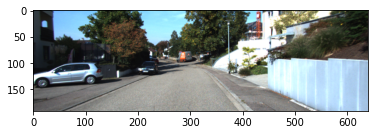

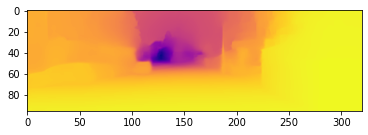

Epoch [29/50][11/438], 6.81 sec(s), Batch loss:1.79433 (Avg:1.55618)
Epoch [29/50][21/438], 6.73 sec(s), Batch loss:1.54484 (Avg:1.49615)
Epoch [29/50][31/438], 6.75 sec(s), Batch loss:1.36762 (Avg:1.43788)
Epoch [29/50][41/438], 6.75 sec(s), Batch loss:1.34153 (Avg:1.41715)
Epoch [29/50][51/438], 6.75 sec(s), Batch loss:1.49580 (Avg:1.42518)
Epoch [29/50][61/438], 6.72 sec(s), Batch loss:1.47802 (Avg:1.45441)
Epoch [29/50][71/438], 6.70 sec(s), Batch loss:1.35254 (Avg:1.43739)
Epoch [29/50][81/438], 6.68 sec(s), Batch loss:1.50187 (Avg:1.42014)
Epoch [29/50][91/438], 6.66 sec(s), Batch loss:1.14958 (Avg:1.41118)
Epoch [29/50][101/438], 6.65 sec(s), Batch loss:1.65147 (Avg:1.41537)
Epoch [29/50][111/438], 6.64 sec(s), Batch loss:1.22870 (Avg:1.40987)
Epoch [29/50][121/438], 6.64 sec(s), Batch loss:1.57289 (Avg:1.41579)
Epoch [29/50][131/438], 6.65 sec(s), Batch loss:1.24693 (Avg:1.41698)
Epoch [29/50][141/438], 6.66 sec(s), Batch loss:1.27075 (Avg:1.41069)
Epoch [29/50][151/438], 6.66 

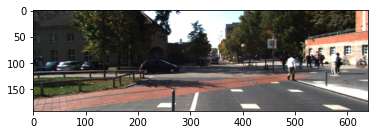

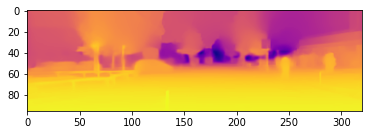

Epoch [29/50][411/438], 6.65 sec(s), Batch loss:1.21129 (Avg:1.37290)
Epoch [29/50][421/438], 6.65 sec(s), Batch loss:1.68588 (Avg:1.37120)
Epoch [29/50][431/438], 6.65 sec(s), Batch loss:1.33037 (Avg:1.37073)


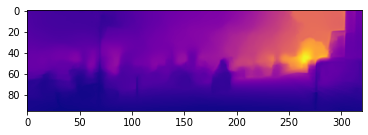

Epoch [29/50], 301.75 sec(s), Avg Train loss:1.37151, Avg Test loss:5.36360
Epoch [30/50][1/438], 6.66 sec(s), Batch loss:1.51658 (Avg:1.51658)


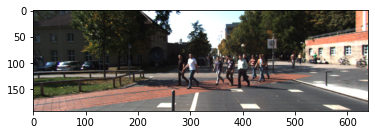

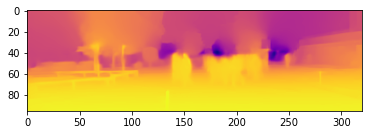

Epoch [30/50][11/438], 6.81 sec(s), Batch loss:1.56511 (Avg:1.35032)
Epoch [30/50][21/438], 6.79 sec(s), Batch loss:1.72543 (Avg:1.35299)
Epoch [30/50][31/438], 6.78 sec(s), Batch loss:1.08198 (Avg:1.32818)
Epoch [30/50][41/438], 6.77 sec(s), Batch loss:1.44917 (Avg:1.35264)
Epoch [30/50][51/438], 6.75 sec(s), Batch loss:1.15451 (Avg:1.34294)
Epoch [30/50][61/438], 6.71 sec(s), Batch loss:1.28492 (Avg:1.33199)
Epoch [30/50][71/438], 6.69 sec(s), Batch loss:1.27557 (Avg:1.33063)
Epoch [30/50][81/438], 6.67 sec(s), Batch loss:1.33354 (Avg:1.33596)
Epoch [30/50][91/438], 6.65 sec(s), Batch loss:1.16000 (Avg:1.33360)
Epoch [30/50][101/438], 6.64 sec(s), Batch loss:1.34295 (Avg:1.33058)
Epoch [30/50][111/438], 6.64 sec(s), Batch loss:0.94953 (Avg:1.32472)
Epoch [30/50][121/438], 6.65 sec(s), Batch loss:1.12746 (Avg:1.31955)
Epoch [30/50][131/438], 6.66 sec(s), Batch loss:1.37762 (Avg:1.32780)
Epoch [30/50][141/438], 6.67 sec(s), Batch loss:1.44868 (Avg:1.33038)
Epoch [30/50][151/438], 6.68 

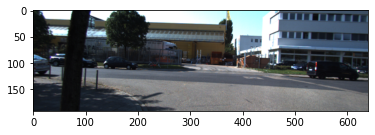

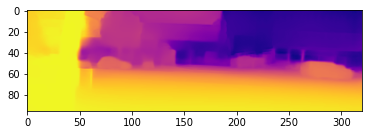

Epoch [30/50][411/438], 6.66 sec(s), Batch loss:1.33810 (Avg:1.35784)
Epoch [30/50][421/438], 6.65 sec(s), Batch loss:2.04970 (Avg:1.36163)
Epoch [30/50][431/438], 6.65 sec(s), Batch loss:1.31879 (Avg:1.36179)


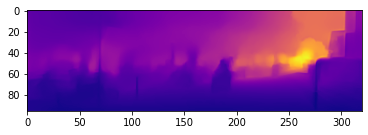

Epoch [30/50], 301.81 sec(s), Avg Train loss:1.36178, Avg Test loss:5.61770
Epoch [31/50][1/438], 6.67 sec(s), Batch loss:1.38686 (Avg:1.38686)


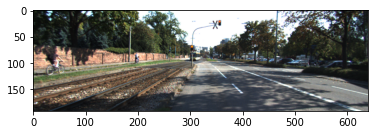

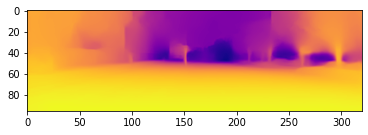

Epoch [31/50][11/438], 7.03 sec(s), Batch loss:1.15649 (Avg:1.33805)
Epoch [31/50][21/438], 6.89 sec(s), Batch loss:1.19729 (Avg:1.30558)
Epoch [31/50][31/438], 6.85 sec(s), Batch loss:1.33720 (Avg:1.31142)
Epoch [31/50][41/438], 6.83 sec(s), Batch loss:1.37727 (Avg:1.31854)
Epoch [31/50][51/438], 6.77 sec(s), Batch loss:1.32169 (Avg:1.31334)
Epoch [31/50][61/438], 6.73 sec(s), Batch loss:2.33587 (Avg:1.36135)
Epoch [31/50][71/438], 6.71 sec(s), Batch loss:2.14323 (Avg:1.39001)
Epoch [31/50][81/438], 6.69 sec(s), Batch loss:1.24095 (Avg:1.39551)
Epoch [31/50][91/438], 6.67 sec(s), Batch loss:1.55339 (Avg:1.38771)
Epoch [31/50][101/438], 6.66 sec(s), Batch loss:1.58701 (Avg:1.38822)
Epoch [31/50][111/438], 6.66 sec(s), Batch loss:1.21955 (Avg:1.39632)
Epoch [31/50][121/438], 6.67 sec(s), Batch loss:1.47389 (Avg:1.40610)
Epoch [31/50][131/438], 6.68 sec(s), Batch loss:1.15371 (Avg:1.39639)
Epoch [31/50][141/438], 6.68 sec(s), Batch loss:1.11660 (Avg:1.39099)
Epoch [31/50][151/438], 6.67 

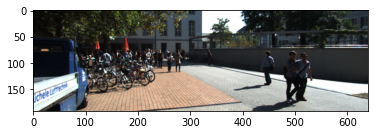

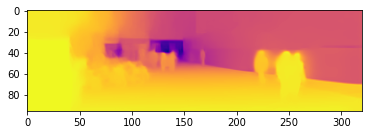

Epoch [31/50][411/438], 6.65 sec(s), Batch loss:1.63693 (Avg:1.40285)
Epoch [31/50][421/438], 6.65 sec(s), Batch loss:1.35257 (Avg:1.40043)
Epoch [31/50][431/438], 6.64 sec(s), Batch loss:1.17139 (Avg:1.40020)


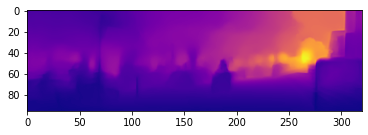

Epoch [31/50], 301.78 sec(s), Avg Train loss:1.39916, Avg Test loss:5.71312
Epoch [32/50][1/438], 7.08 sec(s), Batch loss:1.12988 (Avg:1.12988)


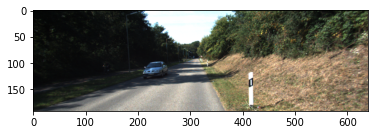

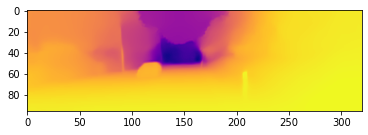

Epoch [32/50][11/438], 7.02 sec(s), Batch loss:1.22543 (Avg:1.41777)
Epoch [32/50][21/438], 6.88 sec(s), Batch loss:1.50846 (Avg:1.43673)
Epoch [32/50][31/438], 6.84 sec(s), Batch loss:1.28324 (Avg:1.41186)
Epoch [32/50][41/438], 6.77 sec(s), Batch loss:1.37620 (Avg:1.40553)
Epoch [32/50][51/438], 6.72 sec(s), Batch loss:1.30056 (Avg:1.39230)
Epoch [32/50][61/438], 6.70 sec(s), Batch loss:1.35906 (Avg:1.37067)
Epoch [32/50][71/438], 6.67 sec(s), Batch loss:1.26297 (Avg:1.36456)
Epoch [32/50][81/438], 6.65 sec(s), Batch loss:1.26342 (Avg:1.36235)
Epoch [32/50][91/438], 6.64 sec(s), Batch loss:1.27774 (Avg:1.34644)
Epoch [32/50][101/438], 6.65 sec(s), Batch loss:1.39788 (Avg:1.33646)
Epoch [32/50][111/438], 6.66 sec(s), Batch loss:1.34865 (Avg:1.34016)
Epoch [32/50][121/438], 6.67 sec(s), Batch loss:1.25390 (Avg:1.33889)
Epoch [32/50][131/438], 6.67 sec(s), Batch loss:1.41061 (Avg:1.34028)
Epoch [32/50][141/438], 6.66 sec(s), Batch loss:1.03216 (Avg:1.33533)
Epoch [32/50][151/438], 6.66 

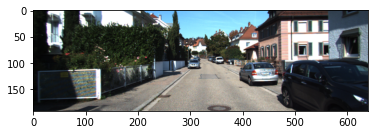

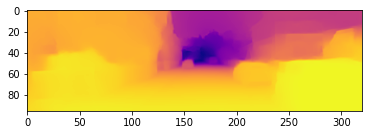

Epoch [32/50][411/438], 6.65 sec(s), Batch loss:1.12731 (Avg:1.32991)
Epoch [32/50][421/438], 6.65 sec(s), Batch loss:1.21544 (Avg:1.32830)
Epoch [32/50][431/438], 6.64 sec(s), Batch loss:1.15678 (Avg:1.32433)


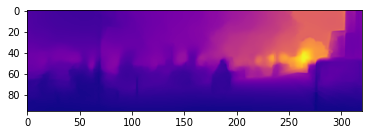

Epoch [32/50], 301.90 sec(s), Avg Train loss:1.32475, Avg Test loss:5.33658
Epoch [33/50][1/438], 6.93 sec(s), Batch loss:0.95281 (Avg:0.95281)


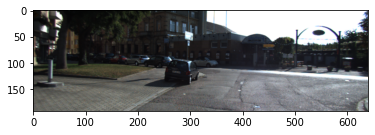

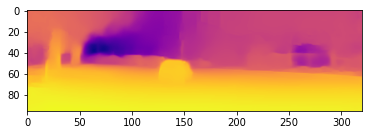

Epoch [33/50][11/438], 7.06 sec(s), Batch loss:1.35926 (Avg:1.27211)
Epoch [33/50][21/438], 6.91 sec(s), Batch loss:1.13584 (Avg:1.25184)
Epoch [33/50][31/438], 6.82 sec(s), Batch loss:1.30320 (Avg:1.27161)
Epoch [33/50][41/438], 6.75 sec(s), Batch loss:1.29330 (Avg:1.28069)
Epoch [33/50][51/438], 6.71 sec(s), Batch loss:1.76114 (Avg:1.32235)
Epoch [33/50][61/438], 6.68 sec(s), Batch loss:1.30008 (Avg:1.33117)
Epoch [33/50][71/438], 6.66 sec(s), Batch loss:1.13178 (Avg:1.31954)
Epoch [33/50][81/438], 6.64 sec(s), Batch loss:1.14024 (Avg:1.32078)
Epoch [33/50][91/438], 6.63 sec(s), Batch loss:1.11891 (Avg:1.31588)
Epoch [33/50][101/438], 6.65 sec(s), Batch loss:1.31869 (Avg:1.30840)
Epoch [33/50][111/438], 6.66 sec(s), Batch loss:1.22323 (Avg:1.30318)
Epoch [33/50][121/438], 6.66 sec(s), Batch loss:1.35473 (Avg:1.30165)
Epoch [33/50][131/438], 6.66 sec(s), Batch loss:1.01526 (Avg:1.29804)
Epoch [33/50][141/438], 6.65 sec(s), Batch loss:1.53833 (Avg:1.30060)
Epoch [33/50][151/438], 6.65 

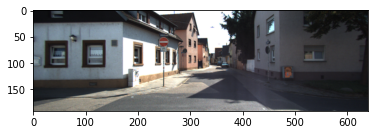

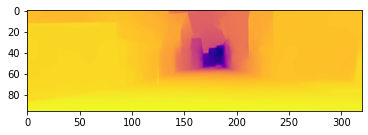

Epoch [33/50][411/438], 6.64 sec(s), Batch loss:1.17452 (Avg:1.30461)
Epoch [33/50][421/438], 6.64 sec(s), Batch loss:1.26696 (Avg:1.30427)
Epoch [33/50][431/438], 6.64 sec(s), Batch loss:1.73579 (Avg:1.30602)


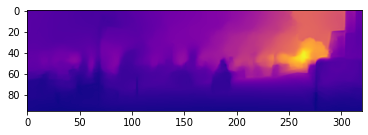

Epoch [33/50], 301.83 sec(s), Avg Train loss:1.30736, Avg Test loss:5.37603
Epoch [34/50][1/438], 6.90 sec(s), Batch loss:1.17288 (Avg:1.17288)


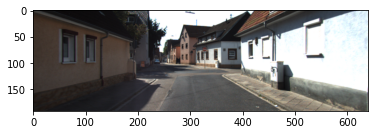

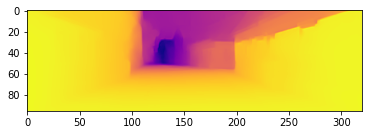

Epoch [34/50][11/438], 7.02 sec(s), Batch loss:1.16474 (Avg:1.23632)
Epoch [34/50][21/438], 6.88 sec(s), Batch loss:1.35403 (Avg:1.23977)
Epoch [34/50][31/438], 6.75 sec(s), Batch loss:1.36212 (Avg:1.23598)
Epoch [34/50][41/438], 6.70 sec(s), Batch loss:1.20210 (Avg:1.24057)
Epoch [34/50][51/438], 6.67 sec(s), Batch loss:1.24085 (Avg:1.25505)
Epoch [34/50][61/438], 6.65 sec(s), Batch loss:1.50998 (Avg:1.26077)
Epoch [34/50][71/438], 6.63 sec(s), Batch loss:1.29035 (Avg:1.28227)
Epoch [34/50][81/438], 6.62 sec(s), Batch loss:1.85463 (Avg:1.31538)
Epoch [34/50][91/438], 6.63 sec(s), Batch loss:1.65398 (Avg:1.32361)
Epoch [34/50][101/438], 6.64 sec(s), Batch loss:1.41109 (Avg:1.31386)
Epoch [34/50][111/438], 6.65 sec(s), Batch loss:1.29339 (Avg:1.32808)
Epoch [34/50][121/438], 6.65 sec(s), Batch loss:1.44193 (Avg:1.32371)
Epoch [34/50][131/438], 6.64 sec(s), Batch loss:1.39125 (Avg:1.32523)
Epoch [34/50][141/438], 6.63 sec(s), Batch loss:1.69075 (Avg:1.32872)
Epoch [34/50][151/438], 6.63 

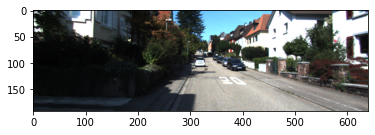

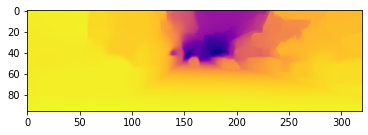

Epoch [34/50][411/438], 6.64 sec(s), Batch loss:0.99252 (Avg:1.31469)
Epoch [34/50][421/438], 6.64 sec(s), Batch loss:1.20662 (Avg:1.31380)
Epoch [34/50][431/438], 6.64 sec(s), Batch loss:1.52513 (Avg:1.31512)


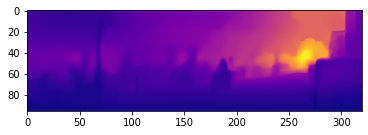

Epoch [34/50], 301.99 sec(s), Avg Train loss:1.31773, Avg Test loss:5.40567
Epoch [35/50][1/438], 6.93 sec(s), Batch loss:1.33970 (Avg:1.33970)


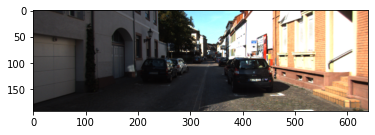

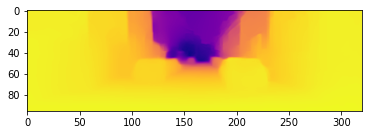

Epoch [35/50][11/438], 7.02 sec(s), Batch loss:1.21355 (Avg:1.29009)
Epoch [35/50][21/438], 6.82 sec(s), Batch loss:1.53525 (Avg:1.27926)
Epoch [35/50][31/438], 6.73 sec(s), Batch loss:1.25620 (Avg:1.29515)
Epoch [35/50][41/438], 6.68 sec(s), Batch loss:1.49858 (Avg:1.31776)
Epoch [35/50][51/438], 6.65 sec(s), Batch loss:1.50805 (Avg:1.31905)
Epoch [35/50][61/438], 6.63 sec(s), Batch loss:1.34086 (Avg:1.32305)
Epoch [35/50][71/438], 6.62 sec(s), Batch loss:1.12220 (Avg:1.31342)
Epoch [35/50][81/438], 6.62 sec(s), Batch loss:1.36618 (Avg:1.31142)
Epoch [35/50][91/438], 6.64 sec(s), Batch loss:1.24658 (Avg:1.30183)
Epoch [35/50][101/438], 6.65 sec(s), Batch loss:1.54223 (Avg:1.30132)
Epoch [35/50][111/438], 6.66 sec(s), Batch loss:1.16464 (Avg:1.29721)
Epoch [35/50][121/438], 6.65 sec(s), Batch loss:1.17143 (Avg:1.29412)
Epoch [35/50][131/438], 6.64 sec(s), Batch loss:1.23785 (Avg:1.29167)
Epoch [35/50][141/438], 6.63 sec(s), Batch loss:1.18330 (Avg:1.29719)
Epoch [35/50][151/438], 6.62 

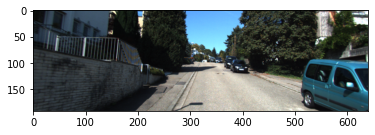

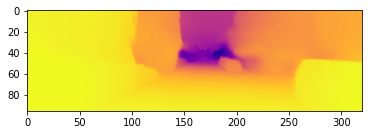

Epoch [35/50][411/438], 6.63 sec(s), Batch loss:1.09849 (Avg:1.28294)
Epoch [35/50][421/438], 6.63 sec(s), Batch loss:1.49133 (Avg:1.28473)
Epoch [35/50][431/438], 6.63 sec(s), Batch loss:1.63588 (Avg:1.28614)


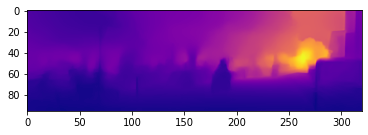

Epoch [35/50], 301.87 sec(s), Avg Train loss:1.28745, Avg Test loss:5.41575
Epoch [36/50][1/438], 6.77 sec(s), Batch loss:1.18914 (Avg:1.18914)


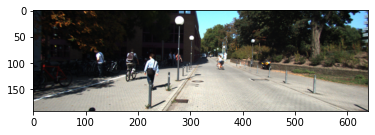

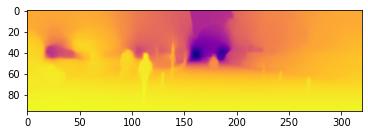

Epoch [36/50][11/438], 6.92 sec(s), Batch loss:1.31335 (Avg:1.19122)
Epoch [36/50][21/438], 6.72 sec(s), Batch loss:1.12307 (Avg:1.18915)
Epoch [36/50][31/438], 6.66 sec(s), Batch loss:1.33373 (Avg:1.23039)
Epoch [36/50][41/438], 6.63 sec(s), Batch loss:1.19279 (Avg:1.26421)
Epoch [36/50][51/438], 6.61 sec(s), Batch loss:1.31280 (Avg:1.28636)
Epoch [36/50][61/438], 6.59 sec(s), Batch loss:1.22083 (Avg:1.29483)
Epoch [36/50][71/438], 6.59 sec(s), Batch loss:1.21223 (Avg:1.31316)
Epoch [36/50][81/438], 6.61 sec(s), Batch loss:1.36521 (Avg:1.32635)
Epoch [36/50][91/438], 6.63 sec(s), Batch loss:1.18272 (Avg:1.31460)
Epoch [36/50][101/438], 6.64 sec(s), Batch loss:1.41805 (Avg:1.31052)
Epoch [36/50][111/438], 6.65 sec(s), Batch loss:1.24541 (Avg:1.31061)
Epoch [36/50][121/438], 6.64 sec(s), Batch loss:1.16986 (Avg:1.30620)
Epoch [36/50][131/438], 6.63 sec(s), Batch loss:1.37069 (Avg:1.30728)
Epoch [36/50][141/438], 6.62 sec(s), Batch loss:1.37273 (Avg:1.30000)
Epoch [36/50][151/438], 6.62 

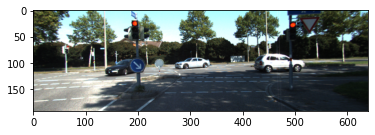

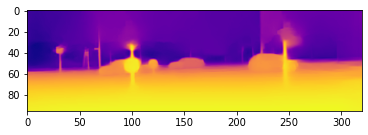

Epoch [36/50][411/438], 6.64 sec(s), Batch loss:1.42010 (Avg:1.29177)
Epoch [36/50][421/438], 6.64 sec(s), Batch loss:1.29394 (Avg:1.28980)
Epoch [36/50][431/438], 6.64 sec(s), Batch loss:1.32507 (Avg:1.28740)


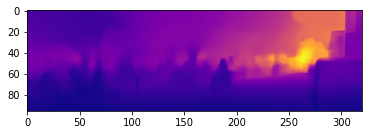

Epoch [36/50], 302.00 sec(s), Avg Train loss:1.28684, Avg Test loss:5.35517
Epoch [37/50][1/438], 6.70 sec(s), Batch loss:1.32859 (Avg:1.32859)


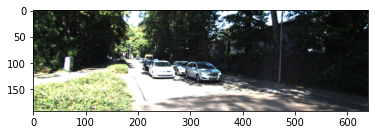

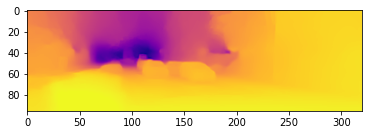

Epoch [37/50][11/438], 6.78 sec(s), Batch loss:1.42447 (Avg:1.25273)
Epoch [37/50][21/438], 6.66 sec(s), Batch loss:1.06867 (Avg:1.22810)
Epoch [37/50][31/438], 6.63 sec(s), Batch loss:1.07510 (Avg:1.23020)
Epoch [37/50][41/438], 6.60 sec(s), Batch loss:1.11010 (Avg:1.23658)
Epoch [37/50][51/438], 6.60 sec(s), Batch loss:1.33836 (Avg:1.25169)
Epoch [37/50][61/438], 6.59 sec(s), Batch loss:1.35562 (Avg:1.25066)
Epoch [37/50][71/438], 6.61 sec(s), Batch loss:1.47812 (Avg:1.25523)
Epoch [37/50][81/438], 6.63 sec(s), Batch loss:1.04941 (Avg:1.25631)
Epoch [37/50][91/438], 6.65 sec(s), Batch loss:1.20492 (Avg:1.25812)
Epoch [37/50][101/438], 6.65 sec(s), Batch loss:1.13143 (Avg:1.25966)
Epoch [37/50][111/438], 6.64 sec(s), Batch loss:1.21280 (Avg:1.26387)
Epoch [37/50][121/438], 6.63 sec(s), Batch loss:1.31580 (Avg:1.26142)
Epoch [37/50][131/438], 6.62 sec(s), Batch loss:1.26486 (Avg:1.25772)
Epoch [37/50][141/438], 6.62 sec(s), Batch loss:1.45339 (Avg:1.25552)
Epoch [37/50][151/438], 6.61 

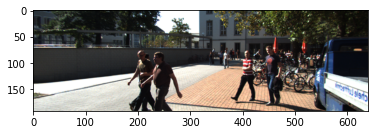

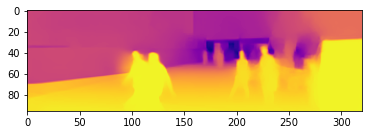

Epoch [37/50][411/438], 6.63 sec(s), Batch loss:1.48528 (Avg:1.24252)
Epoch [37/50][421/438], 6.64 sec(s), Batch loss:1.24437 (Avg:1.24362)
Epoch [37/50][431/438], 6.64 sec(s), Batch loss:1.23257 (Avg:1.24876)


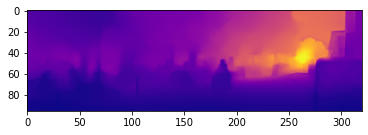

Epoch [37/50], 301.70 sec(s), Avg Train loss:1.24826, Avg Test loss:5.27352
Epoch [38/50][1/438], 6.73 sec(s), Batch loss:1.29810 (Avg:1.29810)


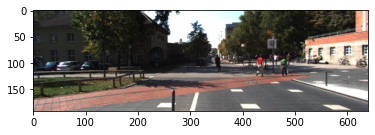

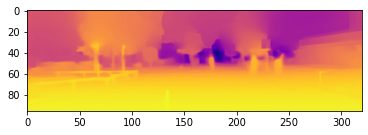

Epoch [38/50][11/438], 6.85 sec(s), Batch loss:1.16438 (Avg:1.29579)
Epoch [38/50][21/438], 6.70 sec(s), Batch loss:1.35635 (Avg:1.28792)
Epoch [38/50][31/438], 6.64 sec(s), Batch loss:1.48321 (Avg:1.31784)
Epoch [38/50][41/438], 6.61 sec(s), Batch loss:1.45341 (Avg:1.31596)
Epoch [38/50][51/438], 6.59 sec(s), Batch loss:0.99102 (Avg:1.28612)
Epoch [38/50][61/438], 6.60 sec(s), Batch loss:0.98598 (Avg:1.30210)
Epoch [38/50][71/438], 6.63 sec(s), Batch loss:1.04381 (Avg:1.27791)
Epoch [38/50][81/438], 6.64 sec(s), Batch loss:1.00085 (Avg:1.26935)
Epoch [38/50][91/438], 6.65 sec(s), Batch loss:1.21286 (Avg:1.26666)
Epoch [38/50][101/438], 6.64 sec(s), Batch loss:1.14603 (Avg:1.27948)
Epoch [38/50][111/438], 6.63 sec(s), Batch loss:1.10228 (Avg:1.27247)
Epoch [38/50][121/438], 6.62 sec(s), Batch loss:1.22044 (Avg:1.27100)
Epoch [38/50][131/438], 6.61 sec(s), Batch loss:1.13224 (Avg:1.27335)
Epoch [38/50][141/438], 6.61 sec(s), Batch loss:1.57657 (Avg:1.27161)
Epoch [38/50][151/438], 6.60 

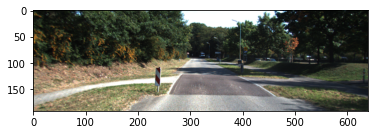

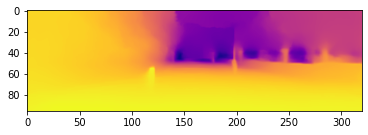

Epoch [38/50][411/438], 6.62 sec(s), Batch loss:1.27564 (Avg:1.26218)
Epoch [38/50][421/438], 6.62 sec(s), Batch loss:1.34018 (Avg:1.26304)
Epoch [38/50][431/438], 6.62 sec(s), Batch loss:1.30836 (Avg:1.26075)


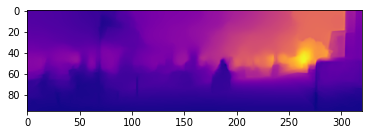

Epoch [38/50], 300.63 sec(s), Avg Train loss:1.26092, Avg Test loss:5.32213
Epoch [39/50][1/438], 6.84 sec(s), Batch loss:1.49456 (Avg:1.49456)


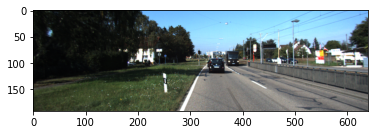

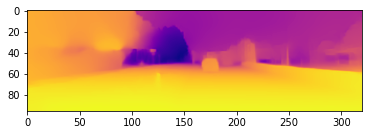

Epoch [39/50][11/438], 7.04 sec(s), Batch loss:1.39964 (Avg:1.23374)
Epoch [39/50][21/438], 6.90 sec(s), Batch loss:1.12037 (Avg:1.23123)
Epoch [39/50][31/438], 6.84 sec(s), Batch loss:1.37314 (Avg:1.21954)
Epoch [39/50][41/438], 6.79 sec(s), Batch loss:1.47577 (Avg:1.24419)
Epoch [39/50][51/438], 6.75 sec(s), Batch loss:1.43971 (Avg:1.24855)
Epoch [39/50][61/438], 6.75 sec(s), Batch loss:1.24738 (Avg:1.23251)
Epoch [39/50][71/438], 6.75 sec(s), Batch loss:1.05267 (Avg:1.22336)
Epoch [39/50][81/438], 6.75 sec(s), Batch loss:1.54555 (Avg:1.22505)
Epoch [39/50][91/438], 6.73 sec(s), Batch loss:1.72269 (Avg:1.24084)
Epoch [39/50][101/438], 6.72 sec(s), Batch loss:1.16453 (Avg:1.23958)
Epoch [39/50][111/438], 6.70 sec(s), Batch loss:1.34908 (Avg:1.24228)
Epoch [39/50][121/438], 6.69 sec(s), Batch loss:1.38375 (Avg:1.24470)
Epoch [39/50][131/438], 6.68 sec(s), Batch loss:1.31979 (Avg:1.24163)
Epoch [39/50][141/438], 6.66 sec(s), Batch loss:1.04018 (Avg:1.24398)
Epoch [39/50][151/438], 6.66 

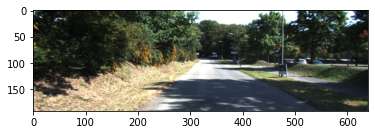

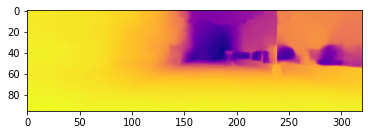

Epoch [39/50][411/438], 6.68 sec(s), Batch loss:1.11003 (Avg:1.24327)
Epoch [39/50][421/438], 6.68 sec(s), Batch loss:1.18993 (Avg:1.24371)
Epoch [39/50][431/438], 6.69 sec(s), Batch loss:1.35498 (Avg:1.24428)


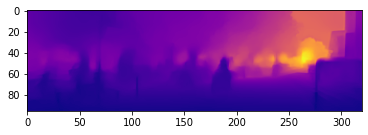

Epoch [39/50], 304.62 sec(s), Avg Train loss:1.24461, Avg Test loss:5.45664
Epoch [40/50][1/438], 7.14 sec(s), Batch loss:1.03930 (Avg:1.03930)


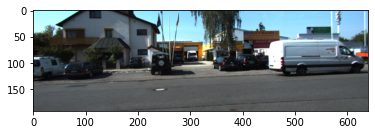

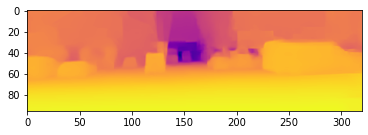

Epoch [40/50][11/438], 7.27 sec(s), Batch loss:1.50815 (Avg:1.20507)
Epoch [40/50][21/438], 7.06 sec(s), Batch loss:1.61744 (Avg:1.26372)
Epoch [40/50][31/438], 6.92 sec(s), Batch loss:1.08468 (Avg:1.25592)
Epoch [40/50][41/438], 6.86 sec(s), Batch loss:1.14651 (Avg:1.24400)
Epoch [40/50][51/438], 6.85 sec(s), Batch loss:1.21175 (Avg:1.24689)
Epoch [40/50][61/438], 6.85 sec(s), Batch loss:1.56348 (Avg:1.24587)
Epoch [40/50][71/438], 6.85 sec(s), Batch loss:1.08031 (Avg:1.22856)
Epoch [40/50][81/438], 6.84 sec(s), Batch loss:1.03287 (Avg:1.23050)
Epoch [40/50][91/438], 6.84 sec(s), Batch loss:1.21925 (Avg:1.22445)
Epoch [40/50][101/438], 6.84 sec(s), Batch loss:1.08436 (Avg:1.21957)
Epoch [40/50][111/438], 6.82 sec(s), Batch loss:1.25516 (Avg:1.22756)
Epoch [40/50][121/438], 6.81 sec(s), Batch loss:1.45956 (Avg:1.23406)
Epoch [40/50][131/438], 6.81 sec(s), Batch loss:1.26545 (Avg:1.23452)
Epoch [40/50][141/438], 6.81 sec(s), Batch loss:1.34328 (Avg:1.24178)
Epoch [40/50][151/438], 6.82 

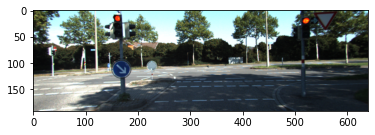

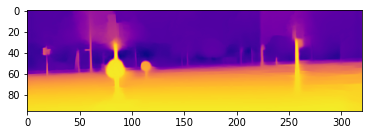

Epoch [40/50][411/438], 6.85 sec(s), Batch loss:1.28775 (Avg:1.25393)
Epoch [40/50][421/438], 6.85 sec(s), Batch loss:1.07848 (Avg:1.25378)
Epoch [40/50][431/438], 6.85 sec(s), Batch loss:1.47663 (Avg:1.25462)


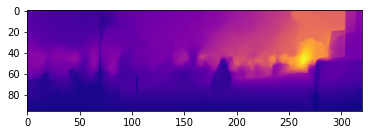

Epoch [40/50], 311.41 sec(s), Avg Train loss:1.25582, Avg Test loss:5.57919
Epoch [41/50][1/438], 7.14 sec(s), Batch loss:1.13846 (Avg:1.13846)


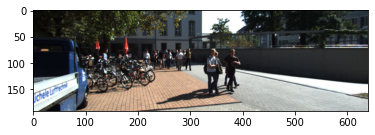

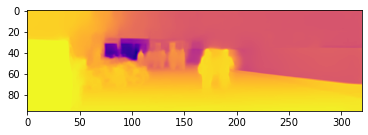

Epoch [41/50][11/438], 7.02 sec(s), Batch loss:1.05599 (Avg:1.23696)
Epoch [41/50][21/438], 6.87 sec(s), Batch loss:1.25152 (Avg:1.20058)
Epoch [41/50][31/438], 6.80 sec(s), Batch loss:1.18612 (Avg:1.23356)
Epoch [41/50][41/438], 6.76 sec(s), Batch loss:1.24098 (Avg:1.20835)
Epoch [41/50][51/438], 6.72 sec(s), Batch loss:1.08673 (Avg:1.19707)
Epoch [41/50][61/438], 6.70 sec(s), Batch loss:1.30141 (Avg:1.20878)
Epoch [41/50][71/438], 6.70 sec(s), Batch loss:1.19338 (Avg:1.19807)
Epoch [41/50][81/438], 6.71 sec(s), Batch loss:1.01929 (Avg:1.19950)
Epoch [41/50][91/438], 6.71 sec(s), Batch loss:1.02850 (Avg:1.19752)
Epoch [41/50][101/438], 6.72 sec(s), Batch loss:1.26211 (Avg:1.20176)
Epoch [41/50][111/438], 6.71 sec(s), Batch loss:1.21006 (Avg:1.19472)
Epoch [41/50][121/438], 6.70 sec(s), Batch loss:1.41368 (Avg:1.19516)
Epoch [41/50][131/438], 6.71 sec(s), Batch loss:1.08211 (Avg:1.19020)
Epoch [41/50][141/438], 6.71 sec(s), Batch loss:1.14319 (Avg:1.18380)
Epoch [41/50][151/438], 6.72 

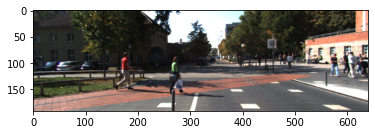

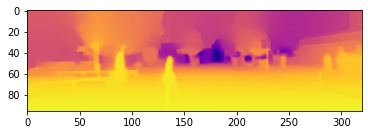

Epoch [41/50][411/438], 6.66 sec(s), Batch loss:1.21624 (Avg:1.21792)
Epoch [41/50][421/438], 6.66 sec(s), Batch loss:1.14207 (Avg:1.21561)
Epoch [41/50][431/438], 6.66 sec(s), Batch loss:1.22772 (Avg:1.21573)


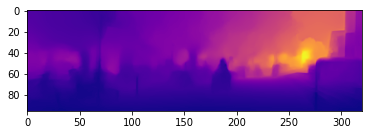

Epoch [41/50], 303.13 sec(s), Avg Train loss:1.21554, Avg Test loss:5.49536
Epoch [42/50][1/438], 6.68 sec(s), Batch loss:1.09765 (Avg:1.09765)


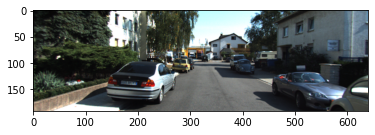

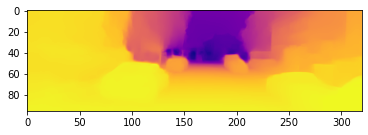

Epoch [42/50][11/438], 6.75 sec(s), Batch loss:1.31635 (Avg:1.13126)
Epoch [42/50][21/438], 6.66 sec(s), Batch loss:1.16367 (Avg:1.13616)
Epoch [42/50][31/438], 6.63 sec(s), Batch loss:1.28264 (Avg:1.16825)
Epoch [42/50][41/438], 6.60 sec(s), Batch loss:1.49648 (Avg:1.17760)
Epoch [42/50][51/438], 6.60 sec(s), Batch loss:1.03539 (Avg:1.17307)
Epoch [42/50][61/438], 6.60 sec(s), Batch loss:1.10522 (Avg:1.16784)
Epoch [42/50][71/438], 6.63 sec(s), Batch loss:1.14083 (Avg:1.17225)
Epoch [42/50][81/438], 6.64 sec(s), Batch loss:1.34120 (Avg:1.16693)
Epoch [42/50][91/438], 6.65 sec(s), Batch loss:1.36011 (Avg:1.17041)
Epoch [42/50][101/438], 6.65 sec(s), Batch loss:1.22359 (Avg:1.18235)
Epoch [42/50][111/438], 6.65 sec(s), Batch loss:1.03218 (Avg:1.18137)
Epoch [42/50][121/438], 6.66 sec(s), Batch loss:0.95056 (Avg:1.18179)
Epoch [42/50][131/438], 6.67 sec(s), Batch loss:1.20936 (Avg:1.18752)
Epoch [42/50][141/438], 6.68 sec(s), Batch loss:1.11207 (Avg:1.18878)
Epoch [42/50][151/438], 6.67 

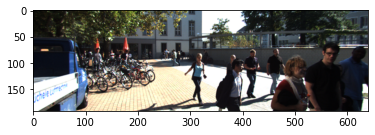

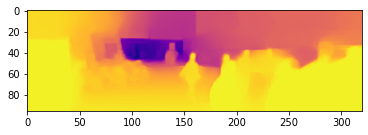

Epoch [42/50][411/438], 6.65 sec(s), Batch loss:1.32597 (Avg:1.21350)
Epoch [42/50][421/438], 6.66 sec(s), Batch loss:1.39265 (Avg:1.21442)
Epoch [42/50][431/438], 6.66 sec(s), Batch loss:1.27873 (Avg:1.21569)


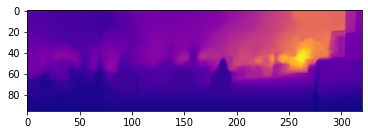

Epoch [42/50], 302.48 sec(s), Avg Train loss:1.21506, Avg Test loss:5.28667
Epoch [43/50][1/438], 6.69 sec(s), Batch loss:1.33777 (Avg:1.33777)


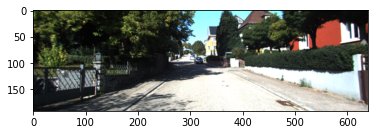

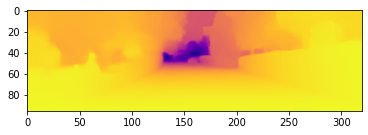

Epoch [43/50][11/438], 6.78 sec(s), Batch loss:1.13416 (Avg:1.16387)
Epoch [43/50][21/438], 6.68 sec(s), Batch loss:1.31066 (Avg:1.22687)
Epoch [43/50][31/438], 6.63 sec(s), Batch loss:1.04530 (Avg:1.22987)
Epoch [43/50][41/438], 6.60 sec(s), Batch loss:1.20431 (Avg:1.20764)
Epoch [43/50][51/438], 6.60 sec(s), Batch loss:1.14261 (Avg:1.19325)
Epoch [43/50][61/438], 6.62 sec(s), Batch loss:1.17357 (Avg:1.18304)
Epoch [43/50][71/438], 6.65 sec(s), Batch loss:1.13547 (Avg:1.17996)
Epoch [43/50][81/438], 6.66 sec(s), Batch loss:1.20948 (Avg:1.17714)
Epoch [43/50][91/438], 6.67 sec(s), Batch loss:1.33089 (Avg:1.18294)
Epoch [43/50][101/438], 6.66 sec(s), Batch loss:1.19292 (Avg:1.19044)
Epoch [43/50][111/438], 6.67 sec(s), Batch loss:1.27701 (Avg:1.19600)
Epoch [43/50][121/438], 6.68 sec(s), Batch loss:1.17930 (Avg:1.20098)
Epoch [43/50][131/438], 6.68 sec(s), Batch loss:1.06346 (Avg:1.20342)
Epoch [43/50][141/438], 6.68 sec(s), Batch loss:1.27122 (Avg:1.20685)
Epoch [43/50][151/438], 6.67 

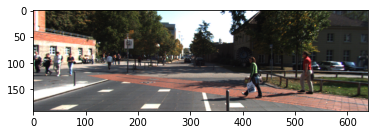

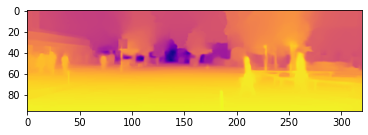

Epoch [43/50][411/438], 6.66 sec(s), Batch loss:1.14682 (Avg:1.20639)
Epoch [43/50][421/438], 6.66 sec(s), Batch loss:1.22916 (Avg:1.20875)
Epoch [43/50][431/438], 6.66 sec(s), Batch loss:1.12414 (Avg:1.20862)


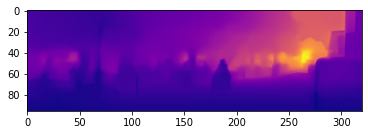

Epoch [43/50], 302.54 sec(s), Avg Train loss:1.20775, Avg Test loss:5.39042
Epoch [44/50][1/438], 6.71 sec(s), Batch loss:1.23443 (Avg:1.23443)


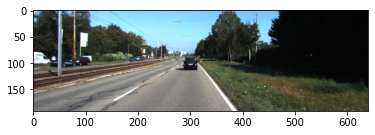

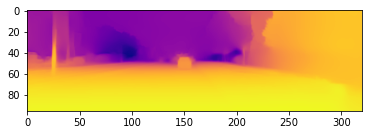

Epoch [44/50][11/438], 6.82 sec(s), Batch loss:1.11162 (Avg:1.17698)
Epoch [44/50][21/438], 6.68 sec(s), Batch loss:1.10951 (Avg:1.17043)
Epoch [44/50][31/438], 6.63 sec(s), Batch loss:1.11287 (Avg:1.18348)
Epoch [44/50][41/438], 6.60 sec(s), Batch loss:1.32846 (Avg:1.17598)
Epoch [44/50][51/438], 6.64 sec(s), Batch loss:1.15816 (Avg:1.17720)
Epoch [44/50][61/438], 6.66 sec(s), Batch loss:1.06446 (Avg:1.18190)
Epoch [44/50][71/438], 6.68 sec(s), Batch loss:0.94010 (Avg:1.16417)
Epoch [44/50][81/438], 6.68 sec(s), Batch loss:1.33552 (Avg:1.17156)
Epoch [44/50][91/438], 6.67 sec(s), Batch loss:1.09226 (Avg:1.18276)
Epoch [44/50][101/438], 6.66 sec(s), Batch loss:1.12554 (Avg:1.18097)
Epoch [44/50][111/438], 6.65 sec(s), Batch loss:0.96012 (Avg:1.17494)
Epoch [44/50][121/438], 6.64 sec(s), Batch loss:1.09983 (Avg:1.17596)
Epoch [44/50][131/438], 6.63 sec(s), Batch loss:1.02010 (Avg:1.17581)
Epoch [44/50][141/438], 6.63 sec(s), Batch loss:1.34100 (Avg:1.17255)
Epoch [44/50][151/438], 6.64 

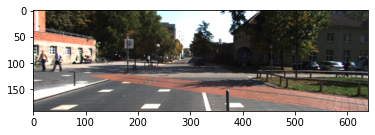

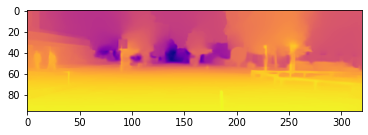

Epoch [44/50][411/438], 6.68 sec(s), Batch loss:0.98101 (Avg:1.18228)
Epoch [44/50][421/438], 6.68 sec(s), Batch loss:1.27741 (Avg:1.18203)
Epoch [44/50][431/438], 6.68 sec(s), Batch loss:1.07498 (Avg:1.18034)


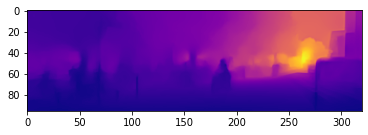

Epoch [44/50], 303.27 sec(s), Avg Train loss:1.17969, Avg Test loss:5.44510
Epoch [45/50][1/438], 6.63 sec(s), Batch loss:1.02467 (Avg:1.02467)


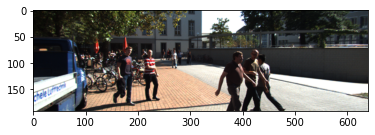

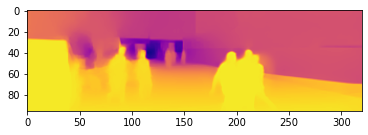

Epoch [45/50][11/438], 6.80 sec(s), Batch loss:0.99411 (Avg:1.13795)
Epoch [45/50][21/438], 6.70 sec(s), Batch loss:1.01154 (Avg:1.13115)
Epoch [45/50][31/438], 6.67 sec(s), Batch loss:1.47713 (Avg:1.14895)
Epoch [45/50][41/438], 6.71 sec(s), Batch loss:1.17904 (Avg:1.17212)
Epoch [45/50][51/438], 6.72 sec(s), Batch loss:0.99811 (Avg:1.16674)
Epoch [45/50][61/438], 6.73 sec(s), Batch loss:1.26439 (Avg:1.16470)
Epoch [45/50][71/438], 6.74 sec(s), Batch loss:1.09557 (Avg:1.16104)
Epoch [45/50][81/438], 6.71 sec(s), Batch loss:1.10775 (Avg:1.15297)
Epoch [45/50][91/438], 6.70 sec(s), Batch loss:1.07242 (Avg:1.15238)
Epoch [45/50][101/438], 6.69 sec(s), Batch loss:1.01354 (Avg:1.15575)
Epoch [45/50][111/438], 6.67 sec(s), Batch loss:1.01562 (Avg:1.15803)
Epoch [45/50][121/438], 6.66 sec(s), Batch loss:0.93699 (Avg:1.16426)
Epoch [45/50][131/438], 6.66 sec(s), Batch loss:1.09478 (Avg:1.17028)
Epoch [45/50][141/438], 6.67 sec(s), Batch loss:1.05325 (Avg:1.17122)
Epoch [45/50][151/438], 6.68 

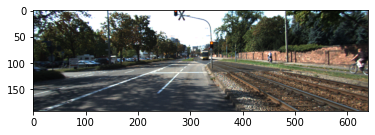

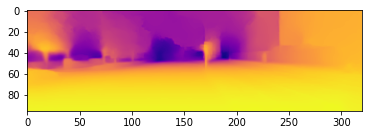

Epoch [45/50][411/438], 6.69 sec(s), Batch loss:1.07036 (Avg:1.16850)
Epoch [45/50][421/438], 6.69 sec(s), Batch loss:1.11033 (Avg:1.16904)
Epoch [45/50][431/438], 6.69 sec(s), Batch loss:1.14208 (Avg:1.16865)


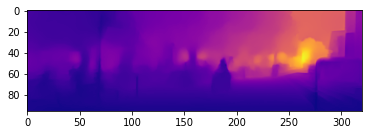

Epoch [45/50], 303.56 sec(s), Avg Train loss:1.17142, Avg Test loss:5.32631
Epoch [46/50][1/438], 6.74 sec(s), Batch loss:0.98321 (Avg:0.98321)


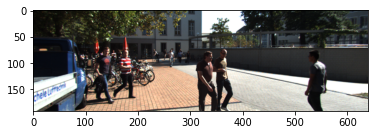

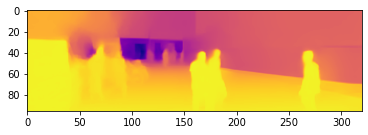

Epoch [46/50][11/438], 6.82 sec(s), Batch loss:1.74558 (Avg:1.30898)
Epoch [46/50][21/438], 6.69 sec(s), Batch loss:1.04064 (Avg:1.23517)
Epoch [46/50][31/438], 6.72 sec(s), Batch loss:1.10240 (Avg:1.19393)
Epoch [46/50][41/438], 6.73 sec(s), Batch loss:1.41763 (Avg:1.21755)
Epoch [46/50][51/438], 6.75 sec(s), Batch loss:1.39853 (Avg:1.21555)
Epoch [46/50][61/438], 6.76 sec(s), Batch loss:1.64632 (Avg:1.25386)
Epoch [46/50][71/438], 6.73 sec(s), Batch loss:1.12455 (Avg:1.24681)
Epoch [46/50][81/438], 6.71 sec(s), Batch loss:1.18095 (Avg:1.24402)
Epoch [46/50][91/438], 6.70 sec(s), Batch loss:1.35040 (Avg:1.23431)
Epoch [46/50][101/438], 6.69 sec(s), Batch loss:1.00724 (Avg:1.22817)
Epoch [46/50][111/438], 6.67 sec(s), Batch loss:1.19003 (Avg:1.21545)
Epoch [46/50][121/438], 6.67 sec(s), Batch loss:1.24563 (Avg:1.20381)
Epoch [46/50][131/438], 6.68 sec(s), Batch loss:1.08747 (Avg:1.20019)
Epoch [46/50][141/438], 6.68 sec(s), Batch loss:1.10010 (Avg:1.19202)
Epoch [46/50][151/438], 6.69 

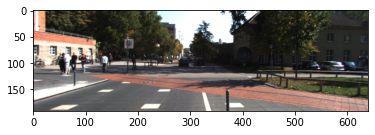

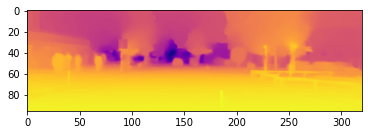

Epoch [46/50][411/438], 6.69 sec(s), Batch loss:1.73007 (Avg:1.16884)
Epoch [46/50][421/438], 6.69 sec(s), Batch loss:0.98300 (Avg:1.16810)
Epoch [46/50][431/438], 6.69 sec(s), Batch loss:1.07178 (Avg:1.16782)


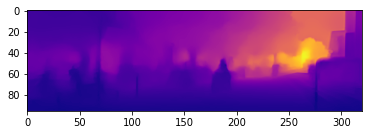

Epoch [46/50], 303.46 sec(s), Avg Train loss:1.16722, Avg Test loss:5.47814
Epoch [47/50][1/438], 6.61 sec(s), Batch loss:1.04815 (Avg:1.04815)


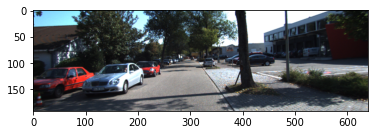

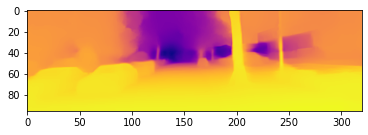

Epoch [47/50][11/438], 6.78 sec(s), Batch loss:1.22705 (Avg:1.08274)
Epoch [47/50][21/438], 6.76 sec(s), Batch loss:1.20636 (Avg:1.10197)
Epoch [47/50][31/438], 6.78 sec(s), Batch loss:1.16355 (Avg:1.11018)
Epoch [47/50][41/438], 6.77 sec(s), Batch loss:1.02949 (Avg:1.10817)
Epoch [47/50][51/438], 6.78 sec(s), Batch loss:1.00808 (Avg:1.10571)
Epoch [47/50][61/438], 6.74 sec(s), Batch loss:1.14074 (Avg:1.10880)
Epoch [47/50][71/438], 6.72 sec(s), Batch loss:1.04319 (Avg:1.10977)
Epoch [47/50][81/438], 6.70 sec(s), Batch loss:1.15520 (Avg:1.11541)
Epoch [47/50][91/438], 6.69 sec(s), Batch loss:1.00728 (Avg:1.11910)
Epoch [47/50][101/438], 6.68 sec(s), Batch loss:1.13521 (Avg:1.13148)
Epoch [47/50][111/438], 6.67 sec(s), Batch loss:1.00861 (Avg:1.13682)
Epoch [47/50][121/438], 6.68 sec(s), Batch loss:1.23341 (Avg:1.13899)
Epoch [47/50][131/438], 6.68 sec(s), Batch loss:1.24996 (Avg:1.13706)
Epoch [47/50][141/438], 6.69 sec(s), Batch loss:0.99483 (Avg:1.13822)
Epoch [47/50][151/438], 6.70 

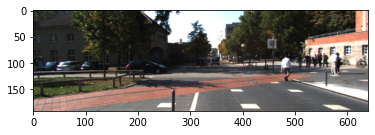

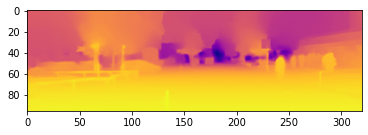

Epoch [47/50][411/438], 6.69 sec(s), Batch loss:1.40536 (Avg:1.15965)
Epoch [47/50][421/438], 6.69 sec(s), Batch loss:1.11055 (Avg:1.15839)
Epoch [47/50][431/438], 6.68 sec(s), Batch loss:1.24622 (Avg:1.15666)


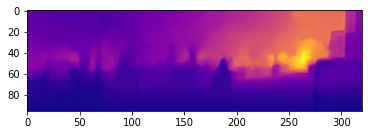

Epoch [47/50], 303.42 sec(s), Avg Train loss:1.15645, Avg Test loss:5.35856
Epoch [48/50][1/438], 6.69 sec(s), Batch loss:1.14704 (Avg:1.14704)


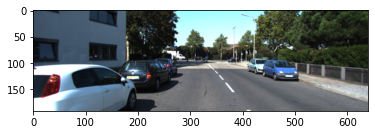

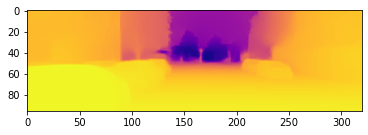

Epoch [48/50][11/438], 6.96 sec(s), Batch loss:1.16494 (Avg:1.15679)
Epoch [48/50][21/438], 6.89 sec(s), Batch loss:1.06428 (Avg:1.12136)
Epoch [48/50][31/438], 6.87 sec(s), Batch loss:1.09362 (Avg:1.13333)
Epoch [48/50][41/438], 6.85 sec(s), Batch loss:1.10180 (Avg:1.14150)
Epoch [48/50][51/438], 6.81 sec(s), Batch loss:1.10445 (Avg:1.13578)
Epoch [48/50][61/438], 6.78 sec(s), Batch loss:1.01129 (Avg:1.13369)
Epoch [48/50][71/438], 6.77 sec(s), Batch loss:1.07848 (Avg:1.12848)
Epoch [48/50][81/438], 6.75 sec(s), Batch loss:1.13435 (Avg:1.13566)
Epoch [48/50][91/438], 6.73 sec(s), Batch loss:1.17877 (Avg:1.13616)
Epoch [48/50][101/438], 6.71 sec(s), Batch loss:1.42032 (Avg:1.14799)
Epoch [48/50][111/438], 6.72 sec(s), Batch loss:0.91550 (Avg:1.15098)
Epoch [48/50][121/438], 6.73 sec(s), Batch loss:1.00155 (Avg:1.15125)
Epoch [48/50][131/438], 6.74 sec(s), Batch loss:0.97435 (Avg:1.14820)
Epoch [48/50][141/438], 6.74 sec(s), Batch loss:1.17550 (Avg:1.14432)
Epoch [48/50][151/438], 6.73 

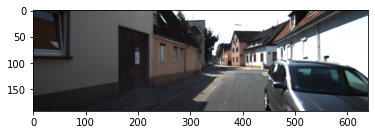

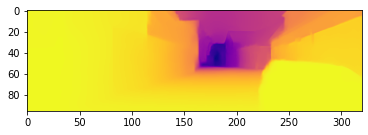

Epoch [48/50][411/438], 6.71 sec(s), Batch loss:1.12587 (Avg:1.12535)
Epoch [48/50][421/438], 6.71 sec(s), Batch loss:1.23676 (Avg:1.12441)
Epoch [48/50][431/438], 6.70 sec(s), Batch loss:0.98949 (Avg:1.12322)


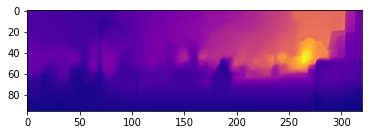

Epoch [48/50], 304.43 sec(s), Avg Train loss:1.12412, Avg Test loss:5.39769
Epoch [49/50][1/438], 7.05 sec(s), Batch loss:0.98950 (Avg:0.98950)


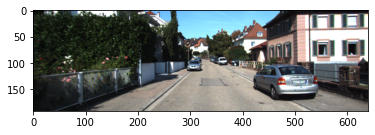

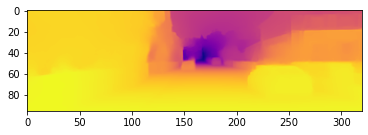

Epoch [49/50][11/438], 7.19 sec(s), Batch loss:1.28473 (Avg:1.08957)
Epoch [49/50][21/438], 7.03 sec(s), Batch loss:1.43830 (Avg:1.11678)
Epoch [49/50][31/438], 6.97 sec(s), Batch loss:0.97682 (Avg:1.09684)
Epoch [49/50][41/438], 6.87 sec(s), Batch loss:1.09439 (Avg:1.09143)
Epoch [49/50][51/438], 6.82 sec(s), Batch loss:1.27751 (Avg:1.12835)
Epoch [49/50][61/438], 6.78 sec(s), Batch loss:0.98867 (Avg:1.13011)
Epoch [49/50][71/438], 6.75 sec(s), Batch loss:1.07933 (Avg:1.13329)
Epoch [49/50][81/438], 6.73 sec(s), Batch loss:1.08658 (Avg:1.14091)
Epoch [49/50][91/438], 6.72 sec(s), Batch loss:1.32980 (Avg:1.15254)
Epoch [49/50][101/438], 6.73 sec(s), Batch loss:1.08123 (Avg:1.16564)
Epoch [49/50][111/438], 6.74 sec(s), Batch loss:1.23464 (Avg:1.16574)
Epoch [49/50][121/438], 6.74 sec(s), Batch loss:1.08871 (Avg:1.15892)
Epoch [49/50][131/438], 6.75 sec(s), Batch loss:1.07718 (Avg:1.15697)
Epoch [49/50][141/438], 6.75 sec(s), Batch loss:1.30199 (Avg:1.15645)
Epoch [49/50][151/438], 6.74 

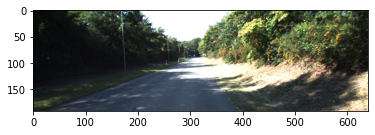

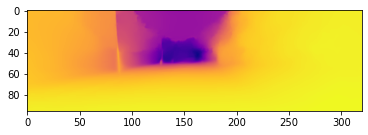

Epoch [49/50][411/438], 6.73 sec(s), Batch loss:1.15276 (Avg:1.15852)
Epoch [49/50][421/438], 6.73 sec(s), Batch loss:1.15239 (Avg:1.15732)
Epoch [49/50][431/438], 6.72 sec(s), Batch loss:1.17099 (Avg:1.15584)


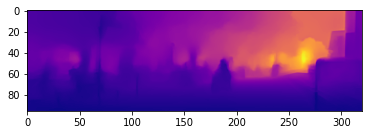

Epoch [49/50], 305.72 sec(s), Avg Train loss:1.15632, Avg Test loss:5.26692
Epoch [50/50][1/438], 7.06 sec(s), Batch loss:1.25428 (Avg:1.25428)


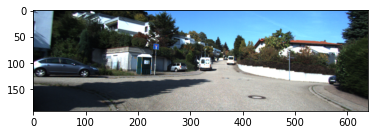

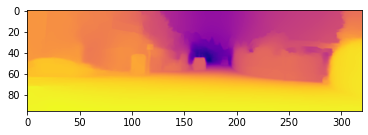

Epoch [50/50][11/438], 7.07 sec(s), Batch loss:1.04403 (Avg:1.21151)
Epoch [50/50][21/438], 6.94 sec(s), Batch loss:1.13142 (Avg:1.25971)
Epoch [50/50][31/438], 6.83 sec(s), Batch loss:1.25542 (Avg:1.22321)
Epoch [50/50][41/438], 6.78 sec(s), Batch loss:1.19970 (Avg:1.19795)
Epoch [50/50][51/438], 6.75 sec(s), Batch loss:1.32505 (Avg:1.18907)
Epoch [50/50][61/438], 6.72 sec(s), Batch loss:1.09612 (Avg:1.18823)
Epoch [50/50][71/438], 6.70 sec(s), Batch loss:1.11439 (Avg:1.18127)
Epoch [50/50][81/438], 6.69 sec(s), Batch loss:1.00726 (Avg:1.17302)
Epoch [50/50][91/438], 6.70 sec(s), Batch loss:1.07774 (Avg:1.15874)
Epoch [50/50][101/438], 6.71 sec(s), Batch loss:0.96127 (Avg:1.15610)
Epoch [50/50][111/438], 6.72 sec(s), Batch loss:1.13102 (Avg:1.15199)
Epoch [50/50][121/438], 6.73 sec(s), Batch loss:1.15414 (Avg:1.14640)
Epoch [50/50][131/438], 6.72 sec(s), Batch loss:1.17734 (Avg:1.14075)
Epoch [50/50][141/438], 6.71 sec(s), Batch loss:1.20879 (Avg:1.13593)
Epoch [50/50][151/438], 6.70 

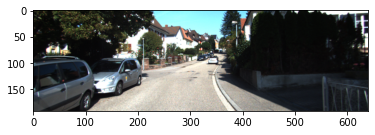

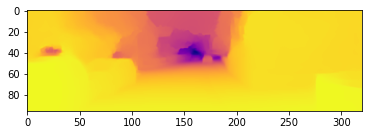

Epoch [50/50][411/438], 6.70 sec(s), Batch loss:0.92924 (Avg:1.11962)
Epoch [50/50][421/438], 6.70 sec(s), Batch loss:1.27492 (Avg:1.11946)
Epoch [50/50][431/438], 6.70 sec(s), Batch loss:1.11358 (Avg:1.11832)


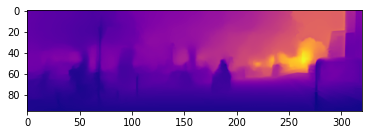

Epoch [50/50], 304.83 sec(s), Avg Train loss:1.11753, Avg Test loss:5.59923


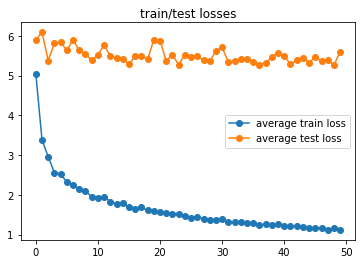

In [ ]:
import time
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import os
import cv2

def main():
    # send the tensor to GPU if you have a GPU; otherwise, send the tensor to CPU
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    # Create model
    model = DepthModel().to(device)
    
    # set batch size and the numer of epoches
    batch_size = 8
    num_epoch = 50
    
    # Adam optimizer with learning rate of 0.0001
    optimizer = torch.optim.Adam( model.parameters(), lr=0.0001 )

    # train
    annotated_directory = "./targetdir/KITTI_small_data/kitti/annotated/train/"
    inpainted_directory = "./targetdir/KITTI_small_data/kitti/inpainted/train/"
    files = []
    for directory in os.listdir(annotated_directory):
        if not directory.startswith('.'):
            for image in os.listdir(os.path.join(annotated_directory,directory,"proj_depth/groundtruth/image_03")):
                files.append((directory, image))
    train_set = KITTI_TrainAugmentDataset(files, inpainted_directory)
    train_loader = DataLoader(train_set, batch_size, shuffle=True)
    
    #val
    val_annotated_directory = "./targetdir/KITTI_small_data/kitti/annotated/val/"
    val_inpainted_directory = "./targetdir/KITTI_small_data/kitti/inpainted/val/"
    files = []
    for directory in os.listdir(val_annotated_directory):
        if not directory.startswith('.'):
            for image in os.listdir(os.path.join(val_annotated_directory,directory,"proj_depth/groundtruth/image_03")):
                if not image.startswith('.'):
                    files.append((directory, image))
    test_set = KITTI_TestDataset(files, val_inpainted_directory)
    test_loader = DataLoader(test_set, batch_size, shuffle=False)

    train_avg_losses = []
    test_avg_losses = []

    # Start training...
    for epoch in range(num_epoch):
        epoch_start_time = time.time()
        train_loss = 0.0
        test_loss = 0.0
        
        # Switch to train mode
        model.train()
        for i, sample_batched in enumerate(train_loader):
            # zero the gradients
            optimizer.zero_grad()
            # Prepare RGB sample and corresponding depth ground truth, and send only one batch to the device.
            train_image = torch.autograd.Variable(sample_batched['image'].to(device))
            train_depth = torch.autograd.Variable(sample_batched['depth'].to(device))
            # Predict depth
            train_output = model(train_image)
            # Compute the loss between the prediction and the ground truth
            batch_loss = depth_loss(train_output, train_depth)
            # auto-compute all gradients 
            batch_loss.backward()
            # update the parameters of the model using the computed gradients
            optimizer.step()
            
            # accumulate loss
            train_loss += batch_loss.item()
            
            # display information about running speed and batch loss
            if i % 10 == 0:
                print('Epoch [{}/{}][{}/{}], {:.2f} sec(s), Batch loss:{:.5f} (Avg:{:.5f})'
                  .format(epoch+1, num_epoch, i+1, train_loader.__len__(), (time.time()-epoch_start_time)*10/(i+1), batch_loss, train_loss/(i+1)))
            if i % 400 == 0:
                input_rgb = train_image.permute(0, 2, 3, 1)
                input_rgb = torch.squeeze(input_rgb[-1]).cpu().detach().numpy()
                plt.figure(1)
                plt.imshow( input_rgb )
                plt.show()
                output_depth = train_output.permute(0, 2, 3, 1)
                output_depth = torch.squeeze(output_depth[-1]).cpu().detach().numpy()
                plt.figure(2)
                plt.imshow( -output_depth, cmap='plasma' )
                plt.show()
        
        
        # switch to test mode 
        model.eval()
        # disable any gradient calculation
        with torch.no_grad():
            for i, sample_batched in enumerate(test_loader):
                # prepare test dataset
                test_image = torch.autograd.Variable(sample_batched['image'].to(device))
                test_depth = torch.autograd.Variable(sample_batched['depth'].to(device))
                # predict
                test_output = model(test_image)
                # loss
                batch_loss = depth_loss(test_output, test_depth)
                
                # accumulate loss
                test_loss += batch_loss.item()
                
                
                # display the depth prediction of last RGB image in test dataset
                if i == len(test_loader)-1:
                    # change the dimensions of the output tensor from (N x C x H x W) to (N x H x W x C)
                    output_depth = test_output.permute(0, 2, 3, 1)
                    # removes all dimensions with a length of one from tensor, it will return a tensor with the size of (H x W)
                    # transfer from tensor to numpy after removing gradients using torch.detach()
                    # output_depth = torch.squeeze(output_depth[-1]).detach().numpy()
                    output_depth = torch.squeeze(output_depth[-1]).cpu().detach().numpy()
                    plt.figure(1)
                    plt.imshow( output_depth, cmap='plasma' )
                    plt.show()
            
            # record average batch losses for training and test sets at one epoch
            train_avg_losses.append(train_loss/train_loader.__len__())
            test_avg_losses.append(test_loss/test_loader.__len__())
            # display information about running speed of one epoch and batch loss
            print('Epoch [{}/{}], {:.2f} sec(s), Avg Train loss:{:.5f}, Avg Test loss:{:.5f}'
                  .format(epoch+1, num_epoch, time.time()-epoch_start_time, train_loss/train_loader.__len__(), test_loss/test_loader.__len__()))
            

    # plot average batch losses for training and test sets
    plt.figure(3)
    plt.plot(train_avg_losses, 'o-', label='average train loss')
    plt.plot(test_avg_losses, 'o-', label='average test loss')
    plt.legend()
    plt.title('train/test losses')
    plt.savefig('losses.png')
    plt.show()
    

    # save model's parameters
    path = 'nyusmall_para.pt'
    torch.save(model.state_dict(), path)

if __name__ == '__main__':
    main()